# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [25]:
# run this once to unzip the file
!unzip processed-celeba-small.zip

Archive:  processed-celeba-small.zip
replace processed_celeba_small/.DS_Store? [y]es, [n]o, [A]ll, [N]one, [r]ename: ^C


In [5]:
from glob import glob
from typing import Tuple, Callable, Dict
import torch.nn as nn
import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, Resize, ToTensor, Normalize , CenterCrop

import pathlib
import tests

In [6]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [7]:
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    # TODO: edit this function by appening transforms to the below list
    transforms = [
        Resize(size), 
        ToTensor(),
        Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ]
    return Compose(transforms)

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [8]:
class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 transforms: Callable = None, 
                 extension: str = '.jpg'):
        
        self.img_dir = list(pathlib.Path(directory).glob('*'+extension))
        self.transform = transforms
        # TODO: implement the init method

    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        # TODO: return the number of elements in the dataset
        return len(self.img_dir)

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        # TODO: return the index-element of the dataset
        image_path = self.img_dir[index]
        img = Image.open(image_path)
        image = self.transform(img)
        return image

In [9]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


The functions below will help you visualize images from the dataset.

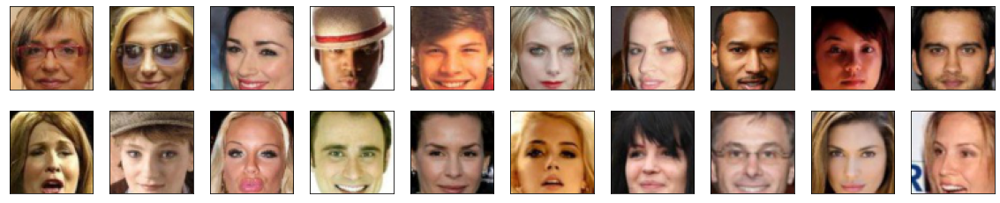

In [10]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [11]:
def scale(x, feature_range=(-1, 1)):
    ''' Scale takes in an image x and returns that image, scaled
       with a feature_range of pixel values from -1 to 1. 
       This function assumes that the input x is already scaled from 0-1.'''
    # assume x is scaled to (0, 1)
    # scale to feature_range and return scaled x
    ####
    arr_min, arr_max = feature_range
    x = x * (arr_max - arr_min) + arr_min
    ####
    return x

In [12]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)

In [13]:
from torch.nn import Module
from torch import nn

In [14]:
class ConvBlock(Module):
    """
    A convolutional block is made of 3 layers: Conv -> BatchNorm -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - batch_norm: whether to use batch norm or not
    """
    def __init__(self, in_channels: int, out_channels: int, kernel_size: int, batch_norm: bool = True):
        super(ConvBlock, self).__init__()
        
        self.conv = torch.nn.Conv2d(in_channels, out_channels, kernel_size, stride=2, padding=1, bias=False)
        self.batch_norm = batch_norm
        if self.batch_norm:
            self.bn = torch.nn.BatchNorm2d(out_channels)
        self.activation = torch.nn.LeakyReLU(0.2)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.conv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)
        return x

In [15]:
class Discriminator(Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        # TODO: instantiate the different layers
         # complete init function
        ndf = 64
        nc = 3
        self.main = nn.Sequential(
            # input is ``(nc) x 64 x 64``
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 32 x 32``
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 16 x 16``
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 8 x 8``
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*8) x 4 x 4``
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            #nn.Dropout(p=0.2),
            #nn.Linear(ndf*4*4, 1),
            #nn.Sigmoid()
        )
#nn.Sigmoid()


      
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x = self.main(x)      
        return x 

In [16]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator()
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [17]:
class Generator(Module):
    def __init__(self, latent_dim: int):
        super(Generator, self).__init__()
        # TODO: instantiate the different layers
        ngf = 64
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( latent_dim, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. ``(ngf*8) x 4 x 4``
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 8 x 8``
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. ``(ngf*2) x 16 x 16``
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. ``(ngf) x 32 x 32``
            nn.ConvTranspose2d(ngf, 3, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nc) x 64 x 64``
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x = self.main(x)
        return x

In [18]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [19]:
import torch.optim as optim


def create_optimizers(generator: Module, discriminator: Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # TODO: implement the generator and discriminator optimizers
    lr = 0.0002
    beta1 = 0.5
    beta2 = 0.999

    g_optimizer = torch.optim.Adam(generator.parameters(), lr, [beta1, beta2])
    d_optimizer = torch.optim.Adam(discriminator.parameters(), lr, [beta1, beta2])
    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [20]:
import torch

# Check for a GPU
train_on_gpu = torch.cuda.is_available()
if not train_on_gpu:
    print('No GPU')
else:
    print('Training on GPU!')

Training on GPU!


In [21]:
def generator_loss(fake_logits):
    """ Generator loss, takes the fake scores as inputs. """
    # TODO: implement the generator loss 
    """
    Wasserstein Generator Loss
    
    args:
    - fake_logits: vector of logits outputed by the discriminator with a fake input image 
    """
    loss = -fake_logits.mean()
    return loss

In [22]:
def fake_loss(D_out):
    batch_size = D_out.size(0)
    labels = torch.zeros(batch_size) # fake labels = 0
    if train_on_gpu:
        labels = labels.cuda()
    criterion = nn.BCEWithLogitsLoss()
    # calculate loss
    loss = criterion(D_out.squeeze(), labels)
    return loss

### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [23]:
def discriminator_loss(real_logits, fake_logits):
    """ Discriminator loss, takes the fake and real logits as inputs. """
    # TODO: implement the discriminator loss 
    """
    Wasserstein Discriminator Loss
    
    args:
    - real_logits: vector of logits outputed by the discriminator with a real input image
    - fake_logits: vector of logits outputed by the discriminator with a fake input image 
    """
    ####
    real_loss = -real_logits.mean()
    fake_loss = fake_logits.mean()
    loss = real_loss + fake_loss
    ####
    return loss

In [24]:
def real_loss(D_out, smooth=False):
    batch_size = D_out.size(0)
    # label smoothing
    if smooth:
        # smooth, real labels = 0.9
        labels = torch.ones(batch_size)*0.9
    else:
        labels = torch.ones(batch_size) # real labels = 1
    # move labels to GPU if available     
    if train_on_gpu:
        labels = labels.cuda()
    # binary cross entropy with logits loss
    criterion = nn.BCEWithLogitsLoss()
    # calculate loss
    loss = criterion(D_out.squeeze(), labels)
    return loss

### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [25]:
def gradient_penalty(discriminator, real_samples, fake_samples):
    """ This function enforces """
    gp = 0
    # TODO (Optional): implement the gradient penalty
    ####

    ####
    return gp

In [26]:
def save_model(discriminator, generator, d_optimizer, g_optimizer, filename="face_dcgan_model.pt"):
    data = dict(
        discriminator=discriminator,
        generator=generator,
        d_optimizer=d_optimizer,
        g_optimizer=g_optimizer
    )
    torch.save(data, filename)

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [27]:
def generator_step(batch_size: int, latent_dim: int) -> Dict:
    """ One training step of the generator. """
    # TODO: implement the generator step (foward pass, loss calculation and backward pass)
    g_optimizer.zero_grad()
    z= np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z= torch.from_numpy(z).float()
    
    if train_on_gpu:
        z = z.cuda()
            
    fake_images = generator(z)
        
    D_fake = discriminator(fake_images)
    g_loss = real_loss(D_fake, True)
    g_loss.backward()
    g_optimizer.step()
    
    return {'loss': g_loss}


def discriminator_step(batch_size: int, latent_dim: int, real_images: torch.Tensor) -> Dict:
    """ One training step of the discriminator. """
    # TODO: implement the discriminator step (foward pass, loss calculation and backward pass)
    d_optimizer.zero_grad()
    D_real = discriminator(real_images)
    

    z = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z = torch.from_numpy(z).float()
    
    if train_on_gpu:
        z = z.cuda()
    
    fake_images = generator(z)
    
    D_fake = discriminator(fake_images.detach())
    
    d_real_loss = real_loss(D_real, True)
    
    d_fake_loss = fake_loss(D_fake) 
    d_loss = d_real_loss + d_fake_loss
    d_loss.backward()
    d_optimizer.step()
    
    return {'loss': d_loss, 'gp': 0}
    

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [28]:
from datetime import datetime
import pickle as pkl

In [29]:
# you can experiment with different dimensions of latent spaces
latent_dim = 128

# update to cpu if you do not have access to a gpu
device = 'cuda'

# number of epochs to train your model
n_epochs = 50

# number of images in each batch
batch_size = 64

In [30]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [31]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2024-07-23 03:25:38 | Epoch [1/50] | Batch 0/509 | d_loss: 1.5140 | g_loss: 2.3132
2024-07-23 03:25:46 | Epoch [1/50] | Batch 50/509 | d_loss: 0.3965 | g_loss: 7.8159
2024-07-23 03:25:52 | Epoch [1/50] | Batch 100/509 | d_loss: 0.5266 | g_loss: 3.4735
2024-07-23 03:25:59 | Epoch [1/50] | Batch 150/509 | d_loss: 0.5915 | g_loss: 3.7123
2024-07-23 03:26:06 | Epoch [1/50] | Batch 200/509 | d_loss: 0.6845 | g_loss: 3.3343
2024-07-23 03:26:13 | Epoch [1/50] | Batch 250/509 | d_loss: 1.0007 | g_loss: 4.9602
2024-07-23 03:26:20 | Epoch [1/50] | Batch 300/509 | d_loss: 0.5641 | g_loss: 3.9450
2024-07-23 03:26:27 | Epoch [1/50] | Batch 350/509 | d_loss: 0.5766 | g_loss: 2.4470
2024-07-23 03:26:34 | Epoch [1/50] | Batch 400/509 | d_loss: 0.6468 | g_loss: 2.6108
2024-07-23 03:26:41 | Epoch [1/50] | Batch 450/509 | d_loss: 1.0603 | g_loss: 6.7270
2024-07-23 03:26:48 | Epoch [1/50] | Batch 500/509 | d_loss: 1.2187 | g_loss: 1.8417


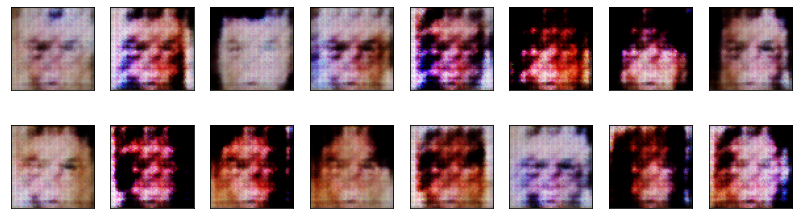

2024-07-23 03:26:53 | Epoch [2/50] | Batch 0/509 | d_loss: 0.7877 | g_loss: 3.6165
2024-07-23 03:27:00 | Epoch [2/50] | Batch 50/509 | d_loss: 1.6289 | g_loss: 8.0263
2024-07-23 03:27:07 | Epoch [2/50] | Batch 100/509 | d_loss: 0.7008 | g_loss: 6.0767
2024-07-23 03:27:14 | Epoch [2/50] | Batch 150/509 | d_loss: 0.5533 | g_loss: 3.3440
2024-07-23 03:27:21 | Epoch [2/50] | Batch 200/509 | d_loss: 0.5988 | g_loss: 2.5439
2024-07-23 03:27:27 | Epoch [2/50] | Batch 250/509 | d_loss: 0.5063 | g_loss: 2.6874
2024-07-23 03:27:34 | Epoch [2/50] | Batch 300/509 | d_loss: 0.4985 | g_loss: 3.8209
2024-07-23 03:27:41 | Epoch [2/50] | Batch 350/509 | d_loss: 0.6191 | g_loss: 3.2393
2024-07-23 03:27:48 | Epoch [2/50] | Batch 400/509 | d_loss: 0.6500 | g_loss: 3.3658
2024-07-23 03:27:55 | Epoch [2/50] | Batch 450/509 | d_loss: 0.5506 | g_loss: 3.5674
2024-07-23 03:28:02 | Epoch [2/50] | Batch 500/509 | d_loss: 0.5842 | g_loss: 2.2748


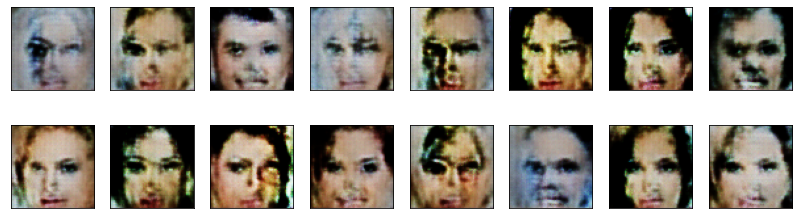

2024-07-23 03:28:07 | Epoch [3/50] | Batch 0/509 | d_loss: 0.6432 | g_loss: 3.8474
2024-07-23 03:28:14 | Epoch [3/50] | Batch 50/509 | d_loss: 0.9163 | g_loss: 1.2535
2024-07-23 03:28:21 | Epoch [3/50] | Batch 100/509 | d_loss: 0.8341 | g_loss: 3.7235
2024-07-23 03:28:28 | Epoch [3/50] | Batch 150/509 | d_loss: 0.5785 | g_loss: 3.1705
2024-07-23 03:28:35 | Epoch [3/50] | Batch 200/509 | d_loss: 0.9853 | g_loss: 4.7498
2024-07-23 03:28:42 | Epoch [3/50] | Batch 250/509 | d_loss: 0.8762 | g_loss: 3.4183
2024-07-23 03:28:49 | Epoch [3/50] | Batch 300/509 | d_loss: 0.6541 | g_loss: 2.6906
2024-07-23 03:28:56 | Epoch [3/50] | Batch 350/509 | d_loss: 0.5198 | g_loss: 3.3033
2024-07-23 03:29:03 | Epoch [3/50] | Batch 400/509 | d_loss: 0.7590 | g_loss: 2.3251
2024-07-23 03:29:10 | Epoch [3/50] | Batch 450/509 | d_loss: 0.6044 | g_loss: 2.0560
2024-07-23 03:29:18 | Epoch [3/50] | Batch 500/509 | d_loss: 0.8690 | g_loss: 1.7328


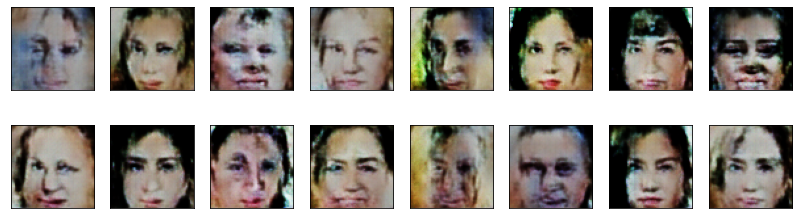

2024-07-23 03:29:23 | Epoch [4/50] | Batch 0/509 | d_loss: 0.7439 | g_loss: 2.8929
2024-07-23 03:29:30 | Epoch [4/50] | Batch 50/509 | d_loss: 0.6545 | g_loss: 3.4386
2024-07-23 03:29:37 | Epoch [4/50] | Batch 100/509 | d_loss: 0.6185 | g_loss: 1.7901
2024-07-23 03:29:44 | Epoch [4/50] | Batch 150/509 | d_loss: 0.5918 | g_loss: 2.1445
2024-07-23 03:29:51 | Epoch [4/50] | Batch 200/509 | d_loss: 0.9274 | g_loss: 1.5620
2024-07-23 03:29:58 | Epoch [4/50] | Batch 250/509 | d_loss: 0.6791 | g_loss: 1.6750
2024-07-23 03:30:04 | Epoch [4/50] | Batch 300/509 | d_loss: 0.6441 | g_loss: 1.7507
2024-07-23 03:30:11 | Epoch [4/50] | Batch 350/509 | d_loss: 0.5387 | g_loss: 3.0103
2024-07-23 03:30:18 | Epoch [4/50] | Batch 400/509 | d_loss: 0.6667 | g_loss: 2.3014
2024-07-23 03:30:25 | Epoch [4/50] | Batch 450/509 | d_loss: 0.4055 | g_loss: 2.8203
2024-07-23 03:30:32 | Epoch [4/50] | Batch 500/509 | d_loss: 0.6375 | g_loss: 2.9064


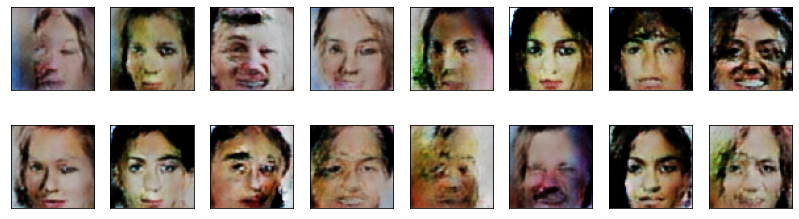

2024-07-23 03:30:36 | Epoch [5/50] | Batch 0/509 | d_loss: 0.5265 | g_loss: 2.7465
2024-07-23 03:30:44 | Epoch [5/50] | Batch 50/509 | d_loss: 1.4840 | g_loss: 2.3125
2024-07-23 03:30:50 | Epoch [5/50] | Batch 100/509 | d_loss: 0.6280 | g_loss: 2.3835
2024-07-23 03:30:57 | Epoch [5/50] | Batch 150/509 | d_loss: 0.5604 | g_loss: 3.3526
2024-07-23 03:31:04 | Epoch [5/50] | Batch 200/509 | d_loss: 0.5130 | g_loss: 3.1751
2024-07-23 03:31:11 | Epoch [5/50] | Batch 250/509 | d_loss: 0.5928 | g_loss: 1.8834
2024-07-23 03:31:18 | Epoch [5/50] | Batch 300/509 | d_loss: 0.4334 | g_loss: 2.3848
2024-07-23 03:31:25 | Epoch [5/50] | Batch 350/509 | d_loss: 1.2585 | g_loss: 5.7277
2024-07-23 03:31:32 | Epoch [5/50] | Batch 400/509 | d_loss: 0.4612 | g_loss: 2.9817
2024-07-23 03:31:39 | Epoch [5/50] | Batch 450/509 | d_loss: 1.1699 | g_loss: 2.5917
2024-07-23 03:31:46 | Epoch [5/50] | Batch 500/509 | d_loss: 1.0841 | g_loss: 1.7750


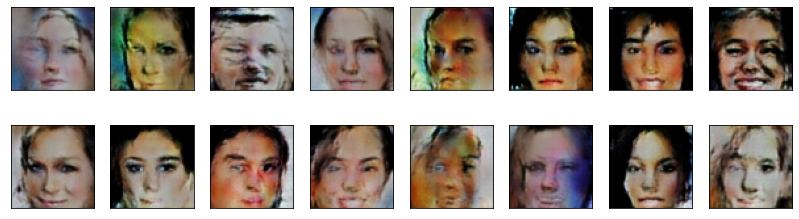

2024-07-23 03:31:51 | Epoch [6/50] | Batch 0/509 | d_loss: 0.5898 | g_loss: 2.3843
2024-07-23 03:31:58 | Epoch [6/50] | Batch 50/509 | d_loss: 0.8462 | g_loss: 3.6018
2024-07-23 03:32:05 | Epoch [6/50] | Batch 100/509 | d_loss: 0.6719 | g_loss: 3.4626
2024-07-23 03:32:12 | Epoch [6/50] | Batch 150/509 | d_loss: 0.6402 | g_loss: 3.1570
2024-07-23 03:32:18 | Epoch [6/50] | Batch 200/509 | d_loss: 0.4305 | g_loss: 2.8302
2024-07-23 03:32:25 | Epoch [6/50] | Batch 250/509 | d_loss: 0.5104 | g_loss: 3.8922
2024-07-23 03:32:32 | Epoch [6/50] | Batch 300/509 | d_loss: 0.5304 | g_loss: 3.5069
2024-07-23 03:32:39 | Epoch [6/50] | Batch 350/509 | d_loss: 0.6470 | g_loss: 3.8683
2024-07-23 03:32:46 | Epoch [6/50] | Batch 400/509 | d_loss: 0.5287 | g_loss: 1.8717
2024-07-23 03:32:53 | Epoch [6/50] | Batch 450/509 | d_loss: 1.1992 | g_loss: 1.9468
2024-07-23 03:33:01 | Epoch [6/50] | Batch 500/509 | d_loss: 0.6442 | g_loss: 2.5216


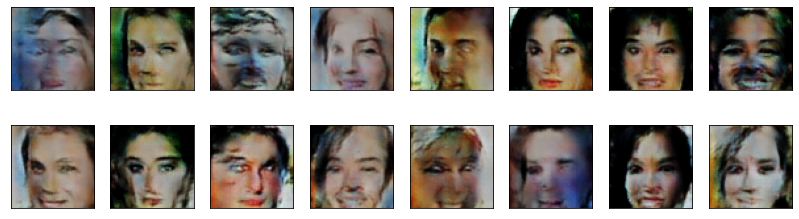

2024-07-23 03:33:05 | Epoch [7/50] | Batch 0/509 | d_loss: 0.7272 | g_loss: 3.7631
2024-07-23 03:33:12 | Epoch [7/50] | Batch 50/509 | d_loss: 0.7477 | g_loss: 2.0555
2024-07-23 03:33:19 | Epoch [7/50] | Batch 100/509 | d_loss: 1.0764 | g_loss: 0.9802
2024-07-23 03:33:26 | Epoch [7/50] | Batch 150/509 | d_loss: 0.5256 | g_loss: 3.2247
2024-07-23 03:33:33 | Epoch [7/50] | Batch 200/509 | d_loss: 0.5536 | g_loss: 2.6325
2024-07-23 03:33:39 | Epoch [7/50] | Batch 250/509 | d_loss: 0.4984 | g_loss: 3.0695
2024-07-23 03:33:46 | Epoch [7/50] | Batch 300/509 | d_loss: 0.7807 | g_loss: 2.7162
2024-07-23 03:33:53 | Epoch [7/50] | Batch 350/509 | d_loss: 0.3804 | g_loss: 3.8348
2024-07-23 03:34:00 | Epoch [7/50] | Batch 400/509 | d_loss: 1.0922 | g_loss: 5.6974
2024-07-23 03:34:07 | Epoch [7/50] | Batch 450/509 | d_loss: 0.4149 | g_loss: 3.8552
2024-07-23 03:34:14 | Epoch [7/50] | Batch 500/509 | d_loss: 0.8070 | g_loss: 4.2013


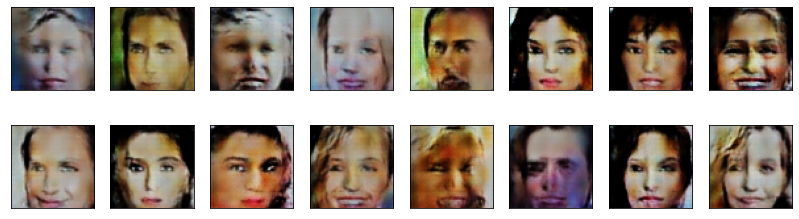

2024-07-23 03:34:19 | Epoch [8/50] | Batch 0/509 | d_loss: 0.6096 | g_loss: 3.8958
2024-07-23 03:34:26 | Epoch [8/50] | Batch 50/509 | d_loss: 0.3917 | g_loss: 3.8618
2024-07-23 03:34:33 | Epoch [8/50] | Batch 100/509 | d_loss: 1.4321 | g_loss: 4.5495
2024-07-23 03:34:40 | Epoch [8/50] | Batch 150/509 | d_loss: 0.5029 | g_loss: 2.4345
2024-07-23 03:34:47 | Epoch [8/50] | Batch 200/509 | d_loss: 0.5085 | g_loss: 3.8130
2024-07-23 03:34:54 | Epoch [8/50] | Batch 250/509 | d_loss: 0.3960 | g_loss: 3.6496
2024-07-23 03:35:01 | Epoch [8/50] | Batch 300/509 | d_loss: 0.6239 | g_loss: 3.8780
2024-07-23 03:35:08 | Epoch [8/50] | Batch 350/509 | d_loss: 0.4492 | g_loss: 2.3408
2024-07-23 03:35:14 | Epoch [8/50] | Batch 400/509 | d_loss: 0.8782 | g_loss: 4.4504
2024-07-23 03:35:21 | Epoch [8/50] | Batch 450/509 | d_loss: 0.6342 | g_loss: 1.5821
2024-07-23 03:35:28 | Epoch [8/50] | Batch 500/509 | d_loss: 0.4278 | g_loss: 3.7436


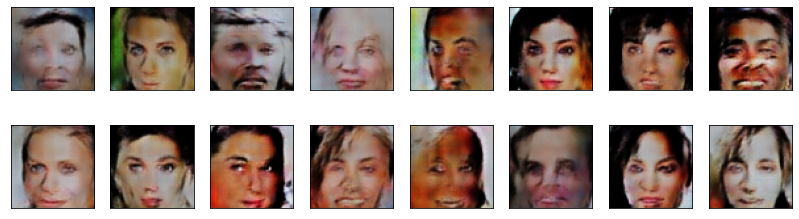

2024-07-23 03:35:34 | Epoch [9/50] | Batch 0/509 | d_loss: 0.3818 | g_loss: 4.3400
2024-07-23 03:35:41 | Epoch [9/50] | Batch 50/509 | d_loss: 0.3952 | g_loss: 3.8177
2024-07-23 03:35:47 | Epoch [9/50] | Batch 100/509 | d_loss: 0.3960 | g_loss: 3.2005
2024-07-23 03:35:54 | Epoch [9/50] | Batch 150/509 | d_loss: 0.4632 | g_loss: 4.5540
2024-07-23 03:36:01 | Epoch [9/50] | Batch 200/509 | d_loss: 0.4221 | g_loss: 4.1529
2024-07-23 03:36:08 | Epoch [9/50] | Batch 250/509 | d_loss: 0.4004 | g_loss: 3.2521
2024-07-23 03:36:15 | Epoch [9/50] | Batch 300/509 | d_loss: 2.0996 | g_loss: 3.5151
2024-07-23 03:36:22 | Epoch [9/50] | Batch 350/509 | d_loss: 0.3717 | g_loss: 4.6263
2024-07-23 03:36:29 | Epoch [9/50] | Batch 400/509 | d_loss: 1.2947 | g_loss: 8.4652
2024-07-23 03:36:36 | Epoch [9/50] | Batch 450/509 | d_loss: 0.3826 | g_loss: 3.7108
2024-07-23 03:36:43 | Epoch [9/50] | Batch 500/509 | d_loss: 0.7973 | g_loss: 2.5392


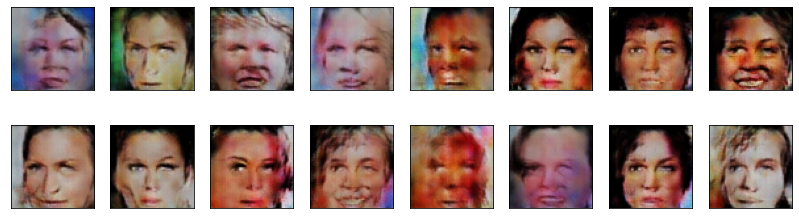

2024-07-23 03:36:49 | Epoch [10/50] | Batch 0/509 | d_loss: 0.4903 | g_loss: 5.3454
2024-07-23 03:36:56 | Epoch [10/50] | Batch 50/509 | d_loss: 0.7037 | g_loss: 2.4465
2024-07-23 03:37:02 | Epoch [10/50] | Batch 100/509 | d_loss: 0.3992 | g_loss: 4.3388
2024-07-23 03:37:09 | Epoch [10/50] | Batch 150/509 | d_loss: 0.3749 | g_loss: 6.2103
2024-07-23 03:37:16 | Epoch [10/50] | Batch 200/509 | d_loss: 0.3886 | g_loss: 4.2323
2024-07-23 03:37:23 | Epoch [10/50] | Batch 250/509 | d_loss: 0.3783 | g_loss: 4.9636
2024-07-23 03:37:30 | Epoch [10/50] | Batch 300/509 | d_loss: 0.5742 | g_loss: 3.1967
2024-07-23 03:37:37 | Epoch [10/50] | Batch 350/509 | d_loss: 0.3796 | g_loss: 3.1547
2024-07-23 03:37:44 | Epoch [10/50] | Batch 400/509 | d_loss: 0.4383 | g_loss: 4.2665
2024-07-23 03:37:51 | Epoch [10/50] | Batch 450/509 | d_loss: 0.6322 | g_loss: 6.4658
2024-07-23 03:37:58 | Epoch [10/50] | Batch 500/509 | d_loss: 0.3728 | g_loss: 4.7427


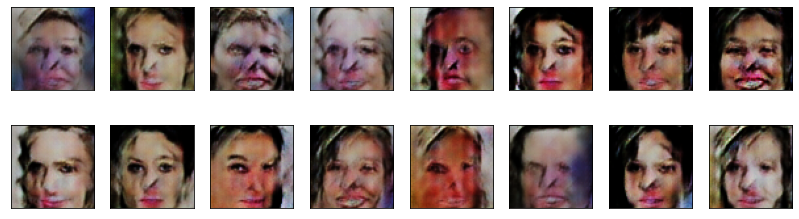

2024-07-23 03:38:02 | Epoch [11/50] | Batch 0/509 | d_loss: 0.7182 | g_loss: 0.4688
2024-07-23 03:38:09 | Epoch [11/50] | Batch 50/509 | d_loss: 0.4071 | g_loss: 3.9579
2024-07-23 03:38:16 | Epoch [11/50] | Batch 100/509 | d_loss: 0.3770 | g_loss: 4.9089
2024-07-23 03:38:23 | Epoch [11/50] | Batch 150/509 | d_loss: 0.4459 | g_loss: 5.8199
2024-07-23 03:38:30 | Epoch [11/50] | Batch 200/509 | d_loss: 0.4481 | g_loss: 3.2818
2024-07-23 03:38:36 | Epoch [11/50] | Batch 250/509 | d_loss: 0.4095 | g_loss: 5.6245
2024-07-23 03:38:43 | Epoch [11/50] | Batch 300/509 | d_loss: 0.3949 | g_loss: 3.4260
2024-07-23 03:38:50 | Epoch [11/50] | Batch 350/509 | d_loss: 0.4475 | g_loss: 4.7997
2024-07-23 03:38:57 | Epoch [11/50] | Batch 400/509 | d_loss: 0.3498 | g_loss: 5.2566
2024-07-23 03:39:04 | Epoch [11/50] | Batch 450/509 | d_loss: 0.3783 | g_loss: 4.7063
2024-07-23 03:39:11 | Epoch [11/50] | Batch 500/509 | d_loss: 0.3618 | g_loss: 4.8298


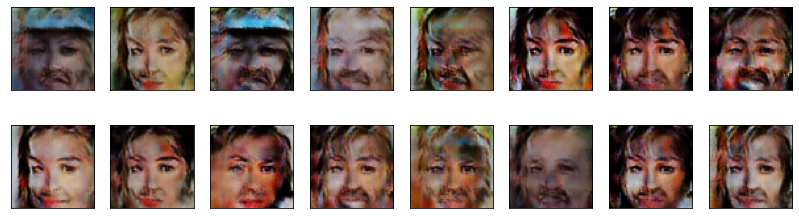

2024-07-23 03:39:16 | Epoch [12/50] | Batch 0/509 | d_loss: 0.6879 | g_loss: 3.8958
2024-07-23 03:39:23 | Epoch [12/50] | Batch 50/509 | d_loss: 0.3864 | g_loss: 4.5362
2024-07-23 03:39:30 | Epoch [12/50] | Batch 100/509 | d_loss: 0.3403 | g_loss: 5.6029
2024-07-23 03:39:37 | Epoch [12/50] | Batch 150/509 | d_loss: 0.3600 | g_loss: 3.5727
2024-07-23 03:39:44 | Epoch [12/50] | Batch 200/509 | d_loss: 0.4273 | g_loss: 6.1162
2024-07-23 03:39:51 | Epoch [12/50] | Batch 250/509 | d_loss: 0.3602 | g_loss: 5.4125
2024-07-23 03:39:58 | Epoch [12/50] | Batch 300/509 | d_loss: 0.3491 | g_loss: 6.5953
2024-07-23 03:40:06 | Epoch [12/50] | Batch 350/509 | d_loss: 0.3432 | g_loss: 5.4350
2024-07-23 03:40:13 | Epoch [12/50] | Batch 400/509 | d_loss: 0.3951 | g_loss: 4.9444
2024-07-23 03:40:20 | Epoch [12/50] | Batch 450/509 | d_loss: 0.3486 | g_loss: 5.6277
2024-07-23 03:40:26 | Epoch [12/50] | Batch 500/509 | d_loss: 0.3611 | g_loss: 5.7558


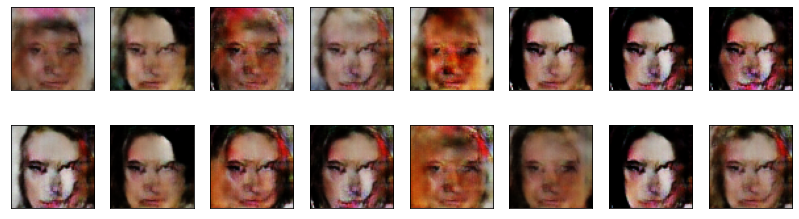

2024-07-23 03:40:32 | Epoch [13/50] | Batch 0/509 | d_loss: 0.3558 | g_loss: 4.0577
2024-07-23 03:40:39 | Epoch [13/50] | Batch 50/509 | d_loss: 0.3842 | g_loss: 3.8827
2024-07-23 03:40:46 | Epoch [13/50] | Batch 100/509 | d_loss: 0.4028 | g_loss: 3.6461
2024-07-23 03:40:53 | Epoch [13/50] | Batch 150/509 | d_loss: 0.3592 | g_loss: 5.6219
2024-07-23 03:41:00 | Epoch [13/50] | Batch 200/509 | d_loss: 0.3623 | g_loss: 4.6490
2024-07-23 03:41:07 | Epoch [13/50] | Batch 250/509 | d_loss: 0.3557 | g_loss: 5.3880
2024-07-23 03:41:13 | Epoch [13/50] | Batch 300/509 | d_loss: 0.3523 | g_loss: 4.5714
2024-07-23 03:41:20 | Epoch [13/50] | Batch 350/509 | d_loss: 0.3579 | g_loss: 4.6930
2024-07-23 03:41:27 | Epoch [13/50] | Batch 400/509 | d_loss: 0.3855 | g_loss: 3.7442
2024-07-23 03:41:34 | Epoch [13/50] | Batch 450/509 | d_loss: 0.3517 | g_loss: 5.3582
2024-07-23 03:41:41 | Epoch [13/50] | Batch 500/509 | d_loss: 0.3822 | g_loss: 5.8270


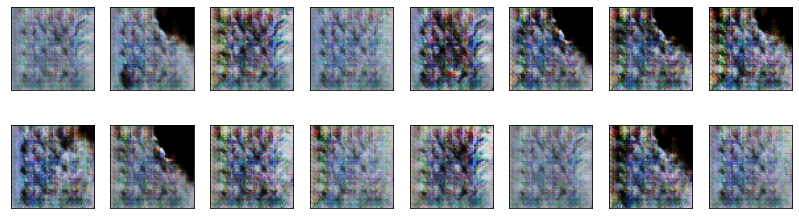

2024-07-23 03:41:46 | Epoch [14/50] | Batch 0/509 | d_loss: 0.3470 | g_loss: 6.0799
2024-07-23 03:41:53 | Epoch [14/50] | Batch 50/509 | d_loss: 0.3466 | g_loss: 5.4687
2024-07-23 03:42:00 | Epoch [14/50] | Batch 100/509 | d_loss: 0.3582 | g_loss: 5.4589
2024-07-23 03:42:07 | Epoch [14/50] | Batch 150/509 | d_loss: 0.3731 | g_loss: 7.0323
2024-07-23 03:42:13 | Epoch [14/50] | Batch 200/509 | d_loss: 0.3325 | g_loss: 6.3113
2024-07-23 03:42:20 | Epoch [14/50] | Batch 250/509 | d_loss: 0.3446 | g_loss: 7.2756
2024-07-23 03:42:27 | Epoch [14/50] | Batch 300/509 | d_loss: 0.3472 | g_loss: 6.2741
2024-07-23 03:42:34 | Epoch [14/50] | Batch 350/509 | d_loss: 0.3719 | g_loss: 5.5418
2024-07-23 03:42:41 | Epoch [14/50] | Batch 400/509 | d_loss: 0.3586 | g_loss: 6.7419
2024-07-23 03:42:48 | Epoch [14/50] | Batch 450/509 | d_loss: 0.3797 | g_loss: 5.3737
2024-07-23 03:42:55 | Epoch [14/50] | Batch 500/509 | d_loss: 0.4128 | g_loss: 4.0570


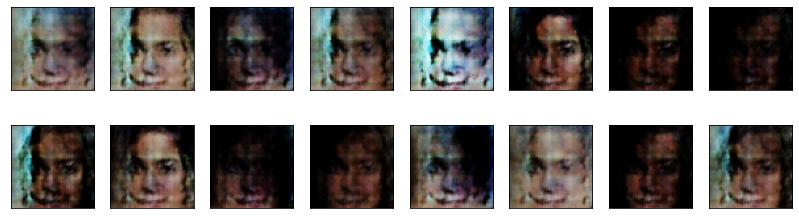

2024-07-23 03:43:00 | Epoch [15/50] | Batch 0/509 | d_loss: 0.4515 | g_loss: 7.8065
2024-07-23 03:43:07 | Epoch [15/50] | Batch 50/509 | d_loss: 0.4217 | g_loss: 6.9047
2024-07-23 03:43:14 | Epoch [15/50] | Batch 100/509 | d_loss: 0.3914 | g_loss: 3.3798
2024-07-23 03:43:21 | Epoch [15/50] | Batch 150/509 | d_loss: 0.4901 | g_loss: 5.6613
2024-07-23 03:43:27 | Epoch [15/50] | Batch 200/509 | d_loss: 0.3835 | g_loss: 7.0071
2024-07-23 03:43:34 | Epoch [15/50] | Batch 250/509 | d_loss: 0.3656 | g_loss: 4.8626
2024-07-23 03:43:41 | Epoch [15/50] | Batch 300/509 | d_loss: 0.3830 | g_loss: 5.8674
2024-07-23 03:43:48 | Epoch [15/50] | Batch 350/509 | d_loss: 0.3751 | g_loss: 6.3108
2024-07-23 03:43:56 | Epoch [15/50] | Batch 400/509 | d_loss: 0.3865 | g_loss: 4.9238
2024-07-23 03:44:03 | Epoch [15/50] | Batch 450/509 | d_loss: 0.3517 | g_loss: 5.4071
2024-07-23 03:44:10 | Epoch [15/50] | Batch 500/509 | d_loss: 0.4659 | g_loss: 3.0312


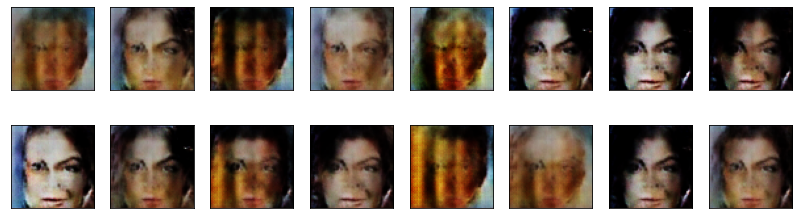

2024-07-23 03:44:15 | Epoch [16/50] | Batch 0/509 | d_loss: 0.3459 | g_loss: 5.4601
2024-07-23 03:44:22 | Epoch [16/50] | Batch 50/509 | d_loss: 0.4672 | g_loss: 4.8387
2024-07-23 03:44:29 | Epoch [16/50] | Batch 100/509 | d_loss: 0.3884 | g_loss: 4.1385
2024-07-23 03:44:35 | Epoch [16/50] | Batch 150/509 | d_loss: 0.4309 | g_loss: 4.4478
2024-07-23 03:44:42 | Epoch [16/50] | Batch 200/509 | d_loss: 0.4320 | g_loss: 3.7375
2024-07-23 03:44:49 | Epoch [16/50] | Batch 250/509 | d_loss: 0.4692 | g_loss: 5.6718
2024-07-23 03:44:56 | Epoch [16/50] | Batch 300/509 | d_loss: 0.6725 | g_loss: 3.5328
2024-07-23 03:45:03 | Epoch [16/50] | Batch 350/509 | d_loss: 0.3762 | g_loss: 5.4019
2024-07-23 03:45:10 | Epoch [16/50] | Batch 400/509 | d_loss: 0.3835 | g_loss: 5.3195
2024-07-23 03:45:17 | Epoch [16/50] | Batch 450/509 | d_loss: 0.4731 | g_loss: 2.0820
2024-07-23 03:45:24 | Epoch [16/50] | Batch 500/509 | d_loss: 0.3631 | g_loss: 4.1063


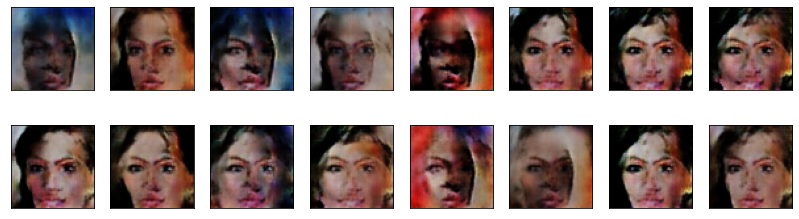

2024-07-23 03:45:29 | Epoch [17/50] | Batch 0/509 | d_loss: 0.7340 | g_loss: 8.1253
2024-07-23 03:45:36 | Epoch [17/50] | Batch 50/509 | d_loss: 0.3889 | g_loss: 4.4675
2024-07-23 03:45:43 | Epoch [17/50] | Batch 100/509 | d_loss: 0.4358 | g_loss: 5.4434
2024-07-23 03:45:50 | Epoch [17/50] | Batch 150/509 | d_loss: 0.5293 | g_loss: 4.7660
2024-07-23 03:45:57 | Epoch [17/50] | Batch 200/509 | d_loss: 0.4077 | g_loss: 5.0314
2024-07-23 03:46:04 | Epoch [17/50] | Batch 250/509 | d_loss: 0.3728 | g_loss: 4.2974
2024-07-23 03:46:11 | Epoch [17/50] | Batch 300/509 | d_loss: 0.4155 | g_loss: 4.5316
2024-07-23 03:46:18 | Epoch [17/50] | Batch 350/509 | d_loss: 0.3869 | g_loss: 4.0498
2024-07-23 03:46:25 | Epoch [17/50] | Batch 400/509 | d_loss: 0.3647 | g_loss: 4.6223
2024-07-23 03:46:32 | Epoch [17/50] | Batch 450/509 | d_loss: 0.4308 | g_loss: 6.2011
2024-07-23 03:46:39 | Epoch [17/50] | Batch 500/509 | d_loss: 0.4979 | g_loss: 3.1931


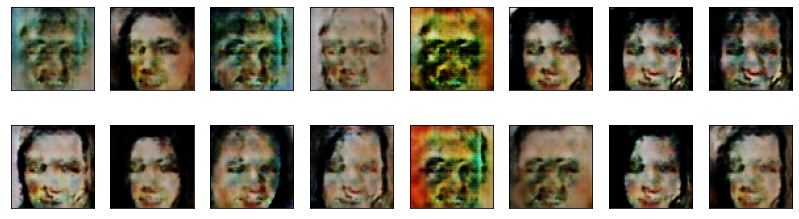

2024-07-23 03:46:43 | Epoch [18/50] | Batch 0/509 | d_loss: 0.4314 | g_loss: 4.3049
2024-07-23 03:46:50 | Epoch [18/50] | Batch 50/509 | d_loss: 0.8820 | g_loss: 5.2327
2024-07-23 03:46:56 | Epoch [18/50] | Batch 100/509 | d_loss: 0.4249 | g_loss: 3.5573
2024-07-23 03:47:03 | Epoch [18/50] | Batch 150/509 | d_loss: 0.4543 | g_loss: 5.7516
2024-07-23 03:47:10 | Epoch [18/50] | Batch 200/509 | d_loss: 0.4312 | g_loss: 5.0847
2024-07-23 03:47:17 | Epoch [18/50] | Batch 250/509 | d_loss: 0.3965 | g_loss: 4.6762
2024-07-23 03:47:24 | Epoch [18/50] | Batch 300/509 | d_loss: 0.3794 | g_loss: 6.2183
2024-07-23 03:47:31 | Epoch [18/50] | Batch 350/509 | d_loss: 0.3703 | g_loss: 4.3638
2024-07-23 03:47:38 | Epoch [18/50] | Batch 400/509 | d_loss: 0.3812 | g_loss: 4.6260
2024-07-23 03:47:45 | Epoch [18/50] | Batch 450/509 | d_loss: 0.4296 | g_loss: 5.4631
2024-07-23 03:47:52 | Epoch [18/50] | Batch 500/509 | d_loss: 0.3725 | g_loss: 5.2792


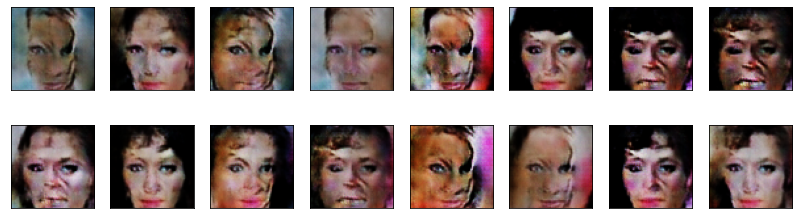

2024-07-23 03:47:56 | Epoch [19/50] | Batch 0/509 | d_loss: 2.2092 | g_loss: 7.8352
2024-07-23 03:48:03 | Epoch [19/50] | Batch 50/509 | d_loss: 0.3871 | g_loss: 3.9107
2024-07-23 03:48:10 | Epoch [19/50] | Batch 100/509 | d_loss: 0.3948 | g_loss: 5.7663
2024-07-23 03:48:17 | Epoch [19/50] | Batch 150/509 | d_loss: 0.3623 | g_loss: 5.1372
2024-07-23 03:48:24 | Epoch [19/50] | Batch 200/509 | d_loss: 0.7426 | g_loss: 12.5539
2024-07-23 03:48:31 | Epoch [19/50] | Batch 250/509 | d_loss: 0.5887 | g_loss: 1.7560
2024-07-23 03:48:38 | Epoch [19/50] | Batch 300/509 | d_loss: 0.3953 | g_loss: 3.8254
2024-07-23 03:48:44 | Epoch [19/50] | Batch 350/509 | d_loss: 0.3522 | g_loss: 5.8576
2024-07-23 03:48:51 | Epoch [19/50] | Batch 400/509 | d_loss: 0.3536 | g_loss: 5.4898
2024-07-23 03:48:58 | Epoch [19/50] | Batch 450/509 | d_loss: 0.4403 | g_loss: 4.9116
2024-07-23 03:49:05 | Epoch [19/50] | Batch 500/509 | d_loss: 0.4018 | g_loss: 5.2440


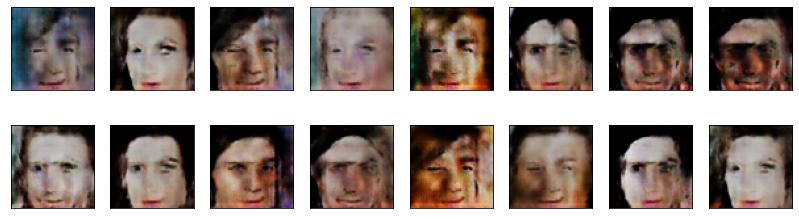

2024-07-23 03:49:11 | Epoch [20/50] | Batch 0/509 | d_loss: 0.4286 | g_loss: 3.1758
2024-07-23 03:49:17 | Epoch [20/50] | Batch 50/509 | d_loss: 0.3945 | g_loss: 5.3999
2024-07-23 03:49:24 | Epoch [20/50] | Batch 100/509 | d_loss: 0.3888 | g_loss: 4.0915
2024-07-23 03:49:31 | Epoch [20/50] | Batch 150/509 | d_loss: 0.3571 | g_loss: 4.2784
2024-07-23 03:49:38 | Epoch [20/50] | Batch 200/509 | d_loss: 0.4524 | g_loss: 5.2174
2024-07-23 03:49:45 | Epoch [20/50] | Batch 250/509 | d_loss: 0.3644 | g_loss: 5.4874
2024-07-23 03:49:52 | Epoch [20/50] | Batch 300/509 | d_loss: 0.3567 | g_loss: 5.5490
2024-07-23 03:49:59 | Epoch [20/50] | Batch 350/509 | d_loss: 0.3670 | g_loss: 5.2062
2024-07-23 03:50:06 | Epoch [20/50] | Batch 400/509 | d_loss: 0.3401 | g_loss: 5.2698
2024-07-23 03:50:13 | Epoch [20/50] | Batch 450/509 | d_loss: 0.4820 | g_loss: 6.5078
2024-07-23 03:50:19 | Epoch [20/50] | Batch 500/509 | d_loss: 0.4023 | g_loss: 6.0199


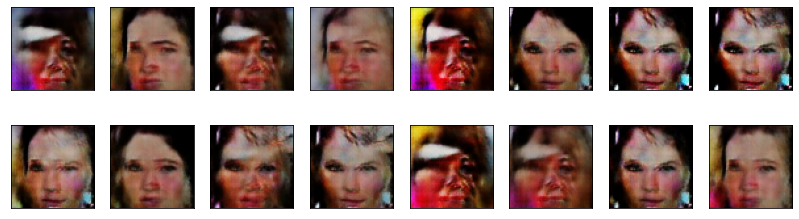

2024-07-23 03:50:25 | Epoch [21/50] | Batch 0/509 | d_loss: 0.3399 | g_loss: 4.7105
2024-07-23 03:50:32 | Epoch [21/50] | Batch 50/509 | d_loss: 0.3997 | g_loss: 3.7219
2024-07-23 03:50:39 | Epoch [21/50] | Batch 100/509 | d_loss: 0.7652 | g_loss: 8.4721
2024-07-23 03:50:46 | Epoch [21/50] | Batch 150/509 | d_loss: 0.4232 | g_loss: 3.7480
2024-07-23 03:50:53 | Epoch [21/50] | Batch 200/509 | d_loss: 0.4377 | g_loss: 5.1898
2024-07-23 03:51:00 | Epoch [21/50] | Batch 250/509 | d_loss: 0.4079 | g_loss: 3.2114
2024-07-23 03:51:06 | Epoch [21/50] | Batch 300/509 | d_loss: 0.3880 | g_loss: 4.0220
2024-07-23 03:51:13 | Epoch [21/50] | Batch 350/509 | d_loss: 0.4419 | g_loss: 3.6220
2024-07-23 03:51:20 | Epoch [21/50] | Batch 400/509 | d_loss: 0.3995 | g_loss: 4.6316
2024-07-23 03:51:27 | Epoch [21/50] | Batch 450/509 | d_loss: 0.4440 | g_loss: 3.4942
2024-07-23 03:51:35 | Epoch [21/50] | Batch 500/509 | d_loss: 0.3643 | g_loss: 4.7468


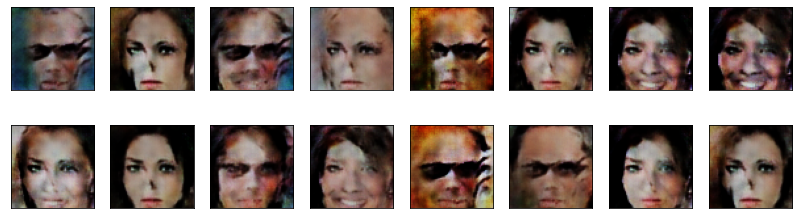

2024-07-23 03:51:40 | Epoch [22/50] | Batch 0/509 | d_loss: 0.3680 | g_loss: 5.7694
2024-07-23 03:51:47 | Epoch [22/50] | Batch 50/509 | d_loss: 0.4319 | g_loss: 4.3842
2024-07-23 03:51:54 | Epoch [22/50] | Batch 100/509 | d_loss: 0.3577 | g_loss: 6.3763
2024-07-23 03:52:01 | Epoch [22/50] | Batch 150/509 | d_loss: 0.5509 | g_loss: 4.2189
2024-07-23 03:52:08 | Epoch [22/50] | Batch 200/509 | d_loss: 0.3568 | g_loss: 5.1610
2024-07-23 03:52:15 | Epoch [22/50] | Batch 250/509 | d_loss: 0.3536 | g_loss: 6.1022
2024-07-23 03:52:22 | Epoch [22/50] | Batch 300/509 | d_loss: 0.3468 | g_loss: 5.5149
2024-07-23 03:52:29 | Epoch [22/50] | Batch 350/509 | d_loss: 0.3430 | g_loss: 6.4065
2024-07-23 03:52:35 | Epoch [22/50] | Batch 400/509 | d_loss: 0.3395 | g_loss: 5.4693
2024-07-23 03:52:42 | Epoch [22/50] | Batch 450/509 | d_loss: 1.8929 | g_loss: 10.0437
2024-07-23 03:52:49 | Epoch [22/50] | Batch 500/509 | d_loss: 0.3936 | g_loss: 5.3166


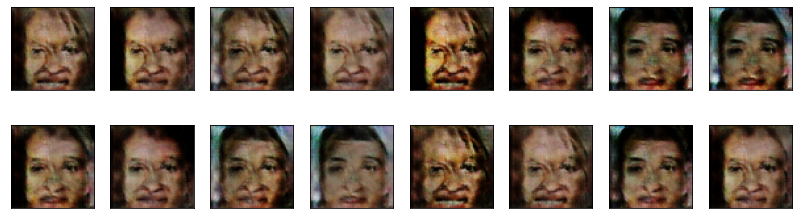

2024-07-23 03:52:55 | Epoch [23/50] | Batch 0/509 | d_loss: 0.3845 | g_loss: 4.6425
2024-07-23 03:53:01 | Epoch [23/50] | Batch 50/509 | d_loss: 0.3607 | g_loss: 5.3039
2024-07-23 03:53:08 | Epoch [23/50] | Batch 100/509 | d_loss: 0.3641 | g_loss: 5.8580
2024-07-23 03:53:15 | Epoch [23/50] | Batch 150/509 | d_loss: 0.3404 | g_loss: 5.4306
2024-07-23 03:53:22 | Epoch [23/50] | Batch 200/509 | d_loss: 0.3487 | g_loss: 5.1491
2024-07-23 03:53:29 | Epoch [23/50] | Batch 250/509 | d_loss: 0.3416 | g_loss: 5.4407
2024-07-23 03:53:36 | Epoch [23/50] | Batch 300/509 | d_loss: 0.3679 | g_loss: 2.9627
2024-07-23 03:53:43 | Epoch [23/50] | Batch 350/509 | d_loss: 0.3449 | g_loss: 5.9414
2024-07-23 03:53:50 | Epoch [23/50] | Batch 400/509 | d_loss: 0.3540 | g_loss: 5.0908
2024-07-23 03:53:57 | Epoch [23/50] | Batch 450/509 | d_loss: 0.3474 | g_loss: 5.8712
2024-07-23 03:54:04 | Epoch [23/50] | Batch 500/509 | d_loss: 0.3434 | g_loss: 6.1484


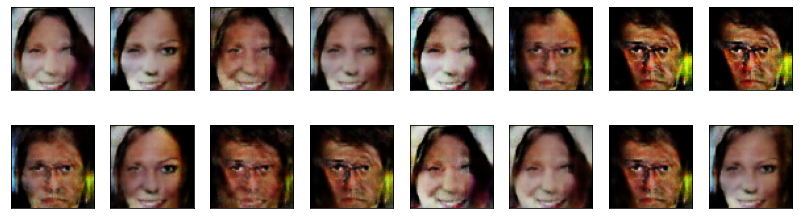

2024-07-23 03:54:09 | Epoch [24/50] | Batch 0/509 | d_loss: 0.3350 | g_loss: 7.8727
2024-07-23 03:54:16 | Epoch [24/50] | Batch 50/509 | d_loss: 0.3397 | g_loss: 6.2769
2024-07-23 03:54:22 | Epoch [24/50] | Batch 100/509 | d_loss: 0.3842 | g_loss: 4.2934
2024-07-23 03:54:29 | Epoch [24/50] | Batch 150/509 | d_loss: 0.3836 | g_loss: 5.8264
2024-07-23 03:54:36 | Epoch [24/50] | Batch 200/509 | d_loss: 0.4008 | g_loss: 5.0030
2024-07-23 03:54:43 | Epoch [24/50] | Batch 250/509 | d_loss: 0.3687 | g_loss: 4.8825
2024-07-23 03:54:50 | Epoch [24/50] | Batch 300/509 | d_loss: 0.3569 | g_loss: 5.1416
2024-07-23 03:54:57 | Epoch [24/50] | Batch 350/509 | d_loss: 0.6521 | g_loss: 13.4881
2024-07-23 03:55:04 | Epoch [24/50] | Batch 400/509 | d_loss: 0.4037 | g_loss: 4.5557
2024-07-23 03:55:11 | Epoch [24/50] | Batch 450/509 | d_loss: 0.3708 | g_loss: 4.6739
2024-07-23 03:55:18 | Epoch [24/50] | Batch 500/509 | d_loss: 0.3981 | g_loss: 3.6193


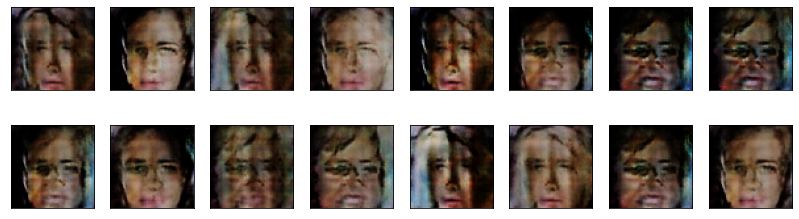

2024-07-23 03:55:23 | Epoch [25/50] | Batch 0/509 | d_loss: 0.3722 | g_loss: 5.0761
2024-07-23 03:55:30 | Epoch [25/50] | Batch 50/509 | d_loss: 0.4141 | g_loss: 4.1262
2024-07-23 03:55:37 | Epoch [25/50] | Batch 100/509 | d_loss: 0.3729 | g_loss: 4.8589
2024-07-23 03:55:44 | Epoch [25/50] | Batch 150/509 | d_loss: 0.3944 | g_loss: 4.4799
2024-07-23 03:55:51 | Epoch [25/50] | Batch 200/509 | d_loss: 0.3944 | g_loss: 4.4004
2024-07-23 03:55:58 | Epoch [25/50] | Batch 250/509 | d_loss: 0.3834 | g_loss: 4.0020
2024-07-23 03:56:05 | Epoch [25/50] | Batch 300/509 | d_loss: 0.3756 | g_loss: 4.1354
2024-07-23 03:56:12 | Epoch [25/50] | Batch 350/509 | d_loss: 0.4017 | g_loss: 4.7756
2024-07-23 03:56:19 | Epoch [25/50] | Batch 400/509 | d_loss: 0.3840 | g_loss: 4.1662
2024-07-23 03:56:26 | Epoch [25/50] | Batch 450/509 | d_loss: 0.3923 | g_loss: 4.1273
2024-07-23 03:56:33 | Epoch [25/50] | Batch 500/509 | d_loss: 0.3455 | g_loss: 5.1744


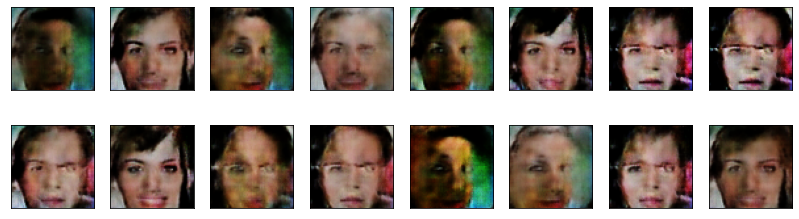

2024-07-23 03:56:38 | Epoch [26/50] | Batch 0/509 | d_loss: 0.4084 | g_loss: 2.7346
2024-07-23 03:56:45 | Epoch [26/50] | Batch 50/509 | d_loss: 0.3633 | g_loss: 7.0349
2024-07-23 03:56:52 | Epoch [26/50] | Batch 100/509 | d_loss: 0.3564 | g_loss: 5.7541
2024-07-23 03:56:59 | Epoch [26/50] | Batch 150/509 | d_loss: 0.4276 | g_loss: 3.9110
2024-07-23 03:57:05 | Epoch [26/50] | Batch 200/509 | d_loss: 0.4280 | g_loss: 4.0083
2024-07-23 03:57:12 | Epoch [26/50] | Batch 250/509 | d_loss: 0.3408 | g_loss: 6.1076
2024-07-23 03:57:19 | Epoch [26/50] | Batch 300/509 | d_loss: 0.3536 | g_loss: 7.1239
2024-07-23 03:57:26 | Epoch [26/50] | Batch 350/509 | d_loss: 0.3621 | g_loss: 4.7289
2024-07-23 03:57:34 | Epoch [26/50] | Batch 400/509 | d_loss: 0.3507 | g_loss: 7.2266
2024-07-23 03:57:41 | Epoch [26/50] | Batch 450/509 | d_loss: 0.3434 | g_loss: 5.6805
2024-07-23 03:57:47 | Epoch [26/50] | Batch 500/509 | d_loss: 0.3431 | g_loss: 5.4017


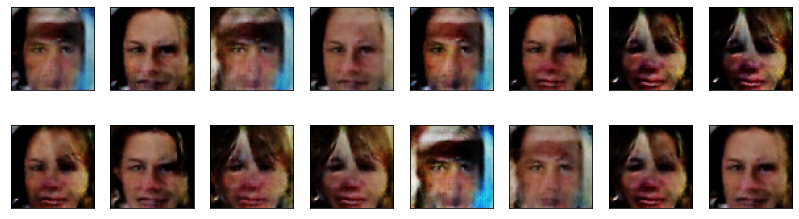

2024-07-23 03:57:53 | Epoch [27/50] | Batch 0/509 | d_loss: 0.3522 | g_loss: 5.8857
2024-07-23 03:57:59 | Epoch [27/50] | Batch 50/509 | d_loss: 0.3796 | g_loss: 4.3605
2024-07-23 03:58:06 | Epoch [27/50] | Batch 100/509 | d_loss: 0.3400 | g_loss: 6.2374
2024-07-23 03:58:13 | Epoch [27/50] | Batch 150/509 | d_loss: 0.3474 | g_loss: 5.1627
2024-07-23 03:58:20 | Epoch [27/50] | Batch 200/509 | d_loss: 0.3460 | g_loss: 5.7842
2024-07-23 03:58:27 | Epoch [27/50] | Batch 250/509 | d_loss: 0.3584 | g_loss: 6.5640
2024-07-23 03:58:34 | Epoch [27/50] | Batch 300/509 | d_loss: 0.3473 | g_loss: 5.5655
2024-07-23 03:58:41 | Epoch [27/50] | Batch 350/509 | d_loss: 0.3569 | g_loss: 5.8701
2024-07-23 03:58:48 | Epoch [27/50] | Batch 400/509 | d_loss: 0.3337 | g_loss: 6.2343
2024-07-23 03:58:54 | Epoch [27/50] | Batch 450/509 | d_loss: 0.3427 | g_loss: 5.7936
2024-07-23 03:59:01 | Epoch [27/50] | Batch 500/509 | d_loss: 0.3333 | g_loss: 6.7963


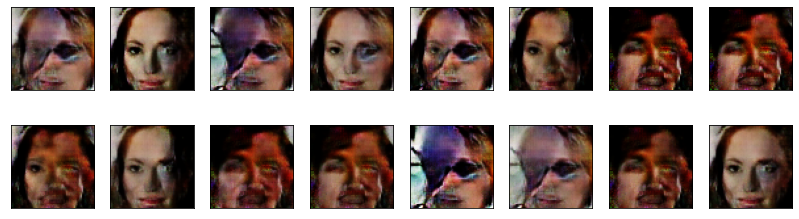

2024-07-23 03:59:07 | Epoch [28/50] | Batch 0/509 | d_loss: 0.3418 | g_loss: 5.7978
2024-07-23 03:59:14 | Epoch [28/50] | Batch 50/509 | d_loss: 0.3338 | g_loss: 5.0525
2024-07-23 03:59:21 | Epoch [28/50] | Batch 100/509 | d_loss: 0.3384 | g_loss: 4.8917
2024-07-23 03:59:27 | Epoch [28/50] | Batch 150/509 | d_loss: 0.3320 | g_loss: 6.0351
2024-07-23 03:59:35 | Epoch [28/50] | Batch 200/509 | d_loss: 0.3303 | g_loss: 6.1269
2024-07-23 03:59:41 | Epoch [28/50] | Batch 250/509 | d_loss: 0.4743 | g_loss: 3.0659
2024-07-23 03:59:48 | Epoch [28/50] | Batch 300/509 | d_loss: 0.3886 | g_loss: 4.6063
2024-07-23 03:59:55 | Epoch [28/50] | Batch 350/509 | d_loss: 0.4144 | g_loss: 4.1298
2024-07-23 04:00:02 | Epoch [28/50] | Batch 400/509 | d_loss: 0.3785 | g_loss: 5.2016
2024-07-23 04:00:09 | Epoch [28/50] | Batch 450/509 | d_loss: 0.4201 | g_loss: 4.4072
2024-07-23 04:00:16 | Epoch [28/50] | Batch 500/509 | d_loss: 0.3923 | g_loss: 4.1968


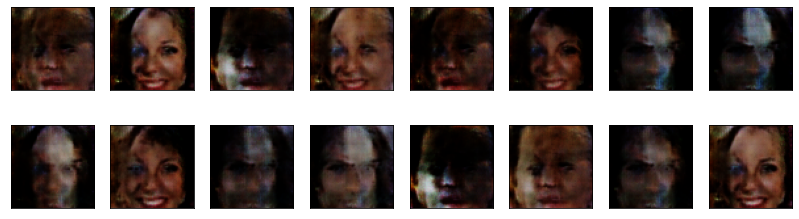

2024-07-23 04:00:22 | Epoch [29/50] | Batch 0/509 | d_loss: 0.5073 | g_loss: 3.0419
2024-07-23 04:00:29 | Epoch [29/50] | Batch 50/509 | d_loss: 0.4144 | g_loss: 4.8538
2024-07-23 04:00:35 | Epoch [29/50] | Batch 100/509 | d_loss: 0.3993 | g_loss: 4.2388
2024-07-23 04:00:42 | Epoch [29/50] | Batch 150/509 | d_loss: 0.5429 | g_loss: 5.1753
2024-07-23 04:00:49 | Epoch [29/50] | Batch 200/509 | d_loss: 0.4899 | g_loss: 7.2590
2024-07-23 04:00:56 | Epoch [29/50] | Batch 250/509 | d_loss: 0.4099 | g_loss: 3.6058
2024-07-23 04:01:04 | Epoch [29/50] | Batch 300/509 | d_loss: 0.3625 | g_loss: 5.1059
2024-07-23 04:01:11 | Epoch [29/50] | Batch 350/509 | d_loss: 0.3783 | g_loss: 4.7529
2024-07-23 04:01:17 | Epoch [29/50] | Batch 400/509 | d_loss: 0.3880 | g_loss: 4.5655
2024-07-23 04:01:25 | Epoch [29/50] | Batch 450/509 | d_loss: 0.4224 | g_loss: 4.7079
2024-07-23 04:01:32 | Epoch [29/50] | Batch 500/509 | d_loss: 0.4484 | g_loss: 5.5738


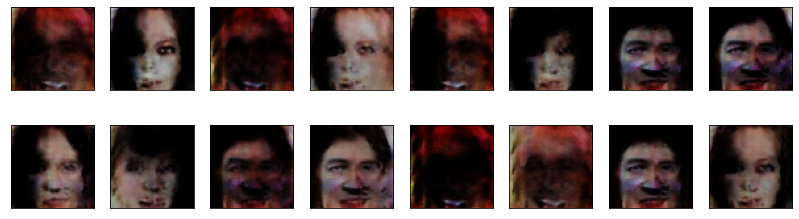

2024-07-23 04:01:37 | Epoch [30/50] | Batch 0/509 | d_loss: 0.4188 | g_loss: 3.3464
2024-07-23 04:01:44 | Epoch [30/50] | Batch 50/509 | d_loss: 0.4371 | g_loss: 3.9409
2024-07-23 04:01:51 | Epoch [30/50] | Batch 100/509 | d_loss: 0.3794 | g_loss: 5.0035
2024-07-23 04:01:58 | Epoch [30/50] | Batch 150/509 | d_loss: 0.3798 | g_loss: 5.3092
2024-07-23 04:02:05 | Epoch [30/50] | Batch 200/509 | d_loss: 0.4321 | g_loss: 3.8930
2024-07-23 04:02:12 | Epoch [30/50] | Batch 250/509 | d_loss: 0.4322 | g_loss: 2.9006
2024-07-23 04:02:19 | Epoch [30/50] | Batch 300/509 | d_loss: 0.3847 | g_loss: 4.9059
2024-07-23 04:02:26 | Epoch [30/50] | Batch 350/509 | d_loss: 0.3697 | g_loss: 4.5880
2024-07-23 04:02:33 | Epoch [30/50] | Batch 400/509 | d_loss: 0.3470 | g_loss: 4.7671
2024-07-23 04:02:39 | Epoch [30/50] | Batch 450/509 | d_loss: 0.3417 | g_loss: 5.0524
2024-07-23 04:02:46 | Epoch [30/50] | Batch 500/509 | d_loss: 0.3604 | g_loss: 5.4485


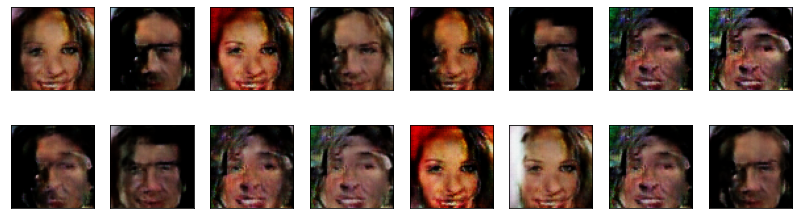

2024-07-23 04:02:53 | Epoch [31/50] | Batch 0/509 | d_loss: 0.3444 | g_loss: 4.5184
2024-07-23 04:03:00 | Epoch [31/50] | Batch 50/509 | d_loss: 0.3364 | g_loss: 5.6960
2024-07-23 04:03:07 | Epoch [31/50] | Batch 100/509 | d_loss: 0.3491 | g_loss: 6.6171
2024-07-23 04:03:14 | Epoch [31/50] | Batch 150/509 | d_loss: 0.4050 | g_loss: 4.0714
2024-07-23 04:03:21 | Epoch [31/50] | Batch 200/509 | d_loss: 0.3875 | g_loss: 3.9602
2024-07-23 04:03:28 | Epoch [31/50] | Batch 250/509 | d_loss: 0.4092 | g_loss: 4.0752
2024-07-23 04:03:35 | Epoch [31/50] | Batch 300/509 | d_loss: 0.4626 | g_loss: 2.4192
2024-07-23 04:03:42 | Epoch [31/50] | Batch 350/509 | d_loss: 0.5667 | g_loss: 6.7618
2024-07-23 04:03:49 | Epoch [31/50] | Batch 400/509 | d_loss: 0.4196 | g_loss: 3.0231
2024-07-23 04:03:56 | Epoch [31/50] | Batch 450/509 | d_loss: 0.3856 | g_loss: 4.7321
2024-07-23 04:04:02 | Epoch [31/50] | Batch 500/509 | d_loss: 0.3658 | g_loss: 4.7238


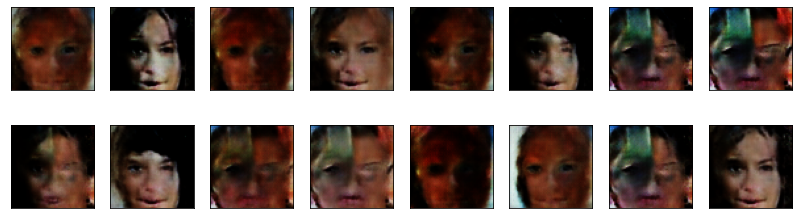

2024-07-23 04:04:08 | Epoch [32/50] | Batch 0/509 | d_loss: 0.3927 | g_loss: 4.9088
2024-07-23 04:04:15 | Epoch [32/50] | Batch 50/509 | d_loss: 0.3491 | g_loss: 4.8532
2024-07-23 04:04:22 | Epoch [32/50] | Batch 100/509 | d_loss: 0.4413 | g_loss: 5.2824
2024-07-23 04:04:28 | Epoch [32/50] | Batch 150/509 | d_loss: 0.3411 | g_loss: 6.1675
2024-07-23 04:04:35 | Epoch [32/50] | Batch 200/509 | d_loss: 0.3680 | g_loss: 4.9237
2024-07-23 04:04:42 | Epoch [32/50] | Batch 250/509 | d_loss: 0.3363 | g_loss: 5.8248
2024-07-23 04:04:49 | Epoch [32/50] | Batch 300/509 | d_loss: 0.3372 | g_loss: 6.5417
2024-07-23 04:04:56 | Epoch [32/50] | Batch 350/509 | d_loss: 0.3391 | g_loss: 6.3184
2024-07-23 04:05:03 | Epoch [32/50] | Batch 400/509 | d_loss: 0.3838 | g_loss: 4.3717
2024-07-23 04:05:10 | Epoch [32/50] | Batch 450/509 | d_loss: 0.3775 | g_loss: 5.0773
2024-07-23 04:05:17 | Epoch [32/50] | Batch 500/509 | d_loss: 0.4889 | g_loss: 1.7993


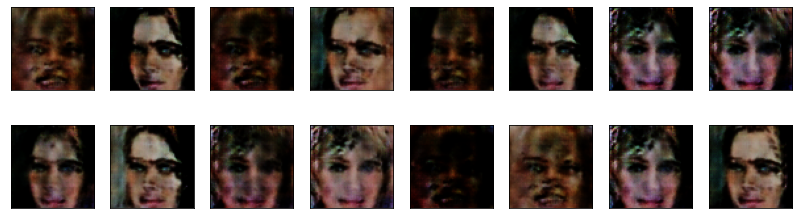

2024-07-23 04:05:23 | Epoch [33/50] | Batch 0/509 | d_loss: 0.3814 | g_loss: 4.2891
2024-07-23 04:05:30 | Epoch [33/50] | Batch 50/509 | d_loss: 0.3681 | g_loss: 3.9356
2024-07-23 04:05:37 | Epoch [33/50] | Batch 100/509 | d_loss: 0.3879 | g_loss: 4.7966
2024-07-23 04:05:44 | Epoch [33/50] | Batch 150/509 | d_loss: 0.4018 | g_loss: 4.3183
2024-07-23 04:05:51 | Epoch [33/50] | Batch 200/509 | d_loss: 0.3853 | g_loss: 4.0341
2024-07-23 04:05:57 | Epoch [33/50] | Batch 250/509 | d_loss: 0.4197 | g_loss: 5.2407
2024-07-23 04:06:04 | Epoch [33/50] | Batch 300/509 | d_loss: 0.3837 | g_loss: 4.7249
2024-07-23 04:06:11 | Epoch [33/50] | Batch 350/509 | d_loss: 0.3472 | g_loss: 4.0335
2024-07-23 04:06:18 | Epoch [33/50] | Batch 400/509 | d_loss: 0.3617 | g_loss: 6.1946
2024-07-23 04:06:25 | Epoch [33/50] | Batch 450/509 | d_loss: 0.7471 | g_loss: 6.5422
2024-07-23 04:06:33 | Epoch [33/50] | Batch 500/509 | d_loss: 0.3663 | g_loss: 5.7664


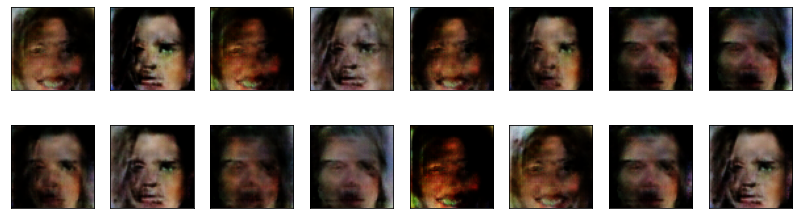

2024-07-23 04:06:39 | Epoch [34/50] | Batch 0/509 | d_loss: 0.3698 | g_loss: 3.9307
2024-07-23 04:06:46 | Epoch [34/50] | Batch 50/509 | d_loss: 0.4369 | g_loss: 3.0926
2024-07-23 04:06:53 | Epoch [34/50] | Batch 100/509 | d_loss: 0.3682 | g_loss: 4.5638
2024-07-23 04:07:00 | Epoch [34/50] | Batch 150/509 | d_loss: 0.3584 | g_loss: 4.5416
2024-07-23 04:07:07 | Epoch [34/50] | Batch 200/509 | d_loss: 0.3450 | g_loss: 6.0917
2024-07-23 04:07:14 | Epoch [34/50] | Batch 250/509 | d_loss: 0.3397 | g_loss: 5.6268
2024-07-23 04:07:21 | Epoch [34/50] | Batch 300/509 | d_loss: 0.3360 | g_loss: 6.0525
2024-07-23 04:07:28 | Epoch [34/50] | Batch 350/509 | d_loss: 0.3520 | g_loss: 6.7073
2024-07-23 04:07:35 | Epoch [34/50] | Batch 400/509 | d_loss: 0.3934 | g_loss: 5.7915
2024-07-23 04:07:42 | Epoch [34/50] | Batch 450/509 | d_loss: 0.3622 | g_loss: 5.4265
2024-07-23 04:07:49 | Epoch [34/50] | Batch 500/509 | d_loss: 0.4050 | g_loss: 4.3737


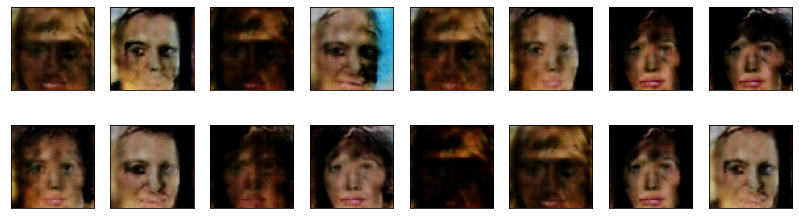

2024-07-23 04:07:54 | Epoch [35/50] | Batch 0/509 | d_loss: 0.3706 | g_loss: 4.5245
2024-07-23 04:08:01 | Epoch [35/50] | Batch 50/509 | d_loss: 0.3539 | g_loss: 7.0595
2024-07-23 04:08:08 | Epoch [35/50] | Batch 100/509 | d_loss: 0.3489 | g_loss: 4.7430
2024-07-23 04:08:15 | Epoch [35/50] | Batch 150/509 | d_loss: 0.4052 | g_loss: 5.3916
2024-07-23 04:08:22 | Epoch [35/50] | Batch 200/509 | d_loss: 0.4001 | g_loss: 7.1749
2024-07-23 04:08:29 | Epoch [35/50] | Batch 250/509 | d_loss: 0.3348 | g_loss: 5.8072
2024-07-23 04:08:36 | Epoch [35/50] | Batch 300/509 | d_loss: 0.3603 | g_loss: 3.8635
2024-07-23 04:08:43 | Epoch [35/50] | Batch 350/509 | d_loss: 0.3416 | g_loss: 6.8664
2024-07-23 04:08:50 | Epoch [35/50] | Batch 400/509 | d_loss: 0.3393 | g_loss: 5.9431
2024-07-23 04:08:57 | Epoch [35/50] | Batch 450/509 | d_loss: 0.3339 | g_loss: 6.4539
2024-07-23 04:09:04 | Epoch [35/50] | Batch 500/509 | d_loss: 0.3326 | g_loss: 6.8365


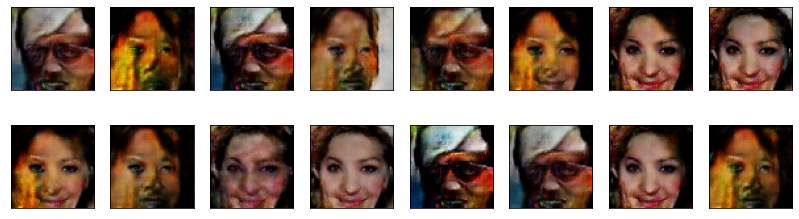

2024-07-23 04:09:09 | Epoch [36/50] | Batch 0/509 | d_loss: 0.3328 | g_loss: 5.8979
2024-07-23 04:09:16 | Epoch [36/50] | Batch 50/509 | d_loss: 0.3396 | g_loss: 6.1215
2024-07-23 04:09:23 | Epoch [36/50] | Batch 100/509 | d_loss: 0.3362 | g_loss: 5.9869
2024-07-23 04:09:30 | Epoch [36/50] | Batch 150/509 | d_loss: 0.3566 | g_loss: 5.1881
2024-07-23 04:09:37 | Epoch [36/50] | Batch 200/509 | d_loss: 0.3432 | g_loss: 5.8856
2024-07-23 04:09:44 | Epoch [36/50] | Batch 250/509 | d_loss: 0.3299 | g_loss: 6.7130
2024-07-23 04:09:52 | Epoch [36/50] | Batch 300/509 | d_loss: 0.3320 | g_loss: 6.9749
2024-07-23 04:09:58 | Epoch [36/50] | Batch 350/509 | d_loss: 0.3340 | g_loss: 6.3151
2024-07-23 04:10:05 | Epoch [36/50] | Batch 400/509 | d_loss: 0.3449 | g_loss: 6.0230
2024-07-23 04:10:12 | Epoch [36/50] | Batch 450/509 | d_loss: 0.3344 | g_loss: 5.4436
2024-07-23 04:10:19 | Epoch [36/50] | Batch 500/509 | d_loss: 0.3382 | g_loss: 5.5868


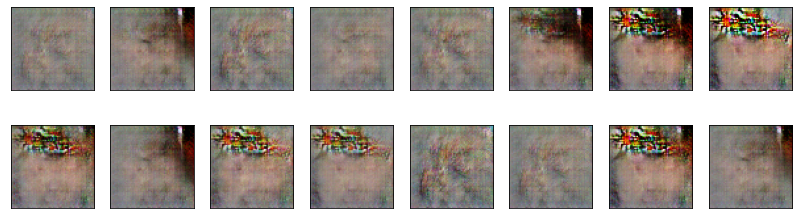

2024-07-23 04:10:24 | Epoch [37/50] | Batch 0/509 | d_loss: 0.3292 | g_loss: 7.0209
2024-07-23 04:10:31 | Epoch [37/50] | Batch 50/509 | d_loss: 0.3340 | g_loss: 6.8679
2024-07-23 04:10:38 | Epoch [37/50] | Batch 100/509 | d_loss: 0.3284 | g_loss: 5.4845
2024-07-23 04:10:45 | Epoch [37/50] | Batch 150/509 | d_loss: 0.3296 | g_loss: 6.3758
2024-07-23 04:10:52 | Epoch [37/50] | Batch 200/509 | d_loss: 0.3282 | g_loss: 7.9007
2024-07-23 04:10:59 | Epoch [37/50] | Batch 250/509 | d_loss: 0.3295 | g_loss: 6.8275
2024-07-23 04:11:06 | Epoch [37/50] | Batch 300/509 | d_loss: 0.3283 | g_loss: 7.1485
2024-07-23 04:11:13 | Epoch [37/50] | Batch 350/509 | d_loss: 0.3303 | g_loss: 7.5209
2024-07-23 04:11:20 | Epoch [37/50] | Batch 400/509 | d_loss: 0.3295 | g_loss: 7.0599
2024-07-23 04:11:27 | Epoch [37/50] | Batch 450/509 | d_loss: 0.3303 | g_loss: 6.3707
2024-07-23 04:11:34 | Epoch [37/50] | Batch 500/509 | d_loss: 0.3314 | g_loss: 6.3101


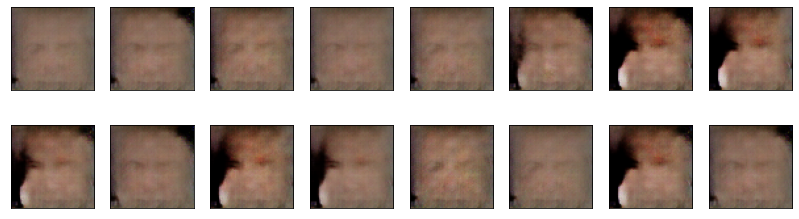

2024-07-23 04:11:39 | Epoch [38/50] | Batch 0/509 | d_loss: 0.3504 | g_loss: 6.1356
2024-07-23 04:11:46 | Epoch [38/50] | Batch 50/509 | d_loss: 0.4047 | g_loss: 4.0436
2024-07-23 04:11:53 | Epoch [38/50] | Batch 100/509 | d_loss: 0.3576 | g_loss: 5.4626
2024-07-23 04:12:00 | Epoch [38/50] | Batch 150/509 | d_loss: 0.3737 | g_loss: 4.6512
2024-07-23 04:12:06 | Epoch [38/50] | Batch 200/509 | d_loss: 0.3688 | g_loss: 4.3112
2024-07-23 04:12:13 | Epoch [38/50] | Batch 250/509 | d_loss: 0.4280 | g_loss: 4.6115
2024-07-23 04:12:20 | Epoch [38/50] | Batch 300/509 | d_loss: 0.3873 | g_loss: 4.2964
2024-07-23 04:12:27 | Epoch [38/50] | Batch 350/509 | d_loss: 0.3647 | g_loss: 7.1522
2024-07-23 04:12:34 | Epoch [38/50] | Batch 400/509 | d_loss: 0.3817 | g_loss: 4.2855
2024-07-23 04:12:41 | Epoch [38/50] | Batch 450/509 | d_loss: 0.4153 | g_loss: 4.4816
2024-07-23 04:12:48 | Epoch [38/50] | Batch 500/509 | d_loss: 0.3794 | g_loss: 4.8737


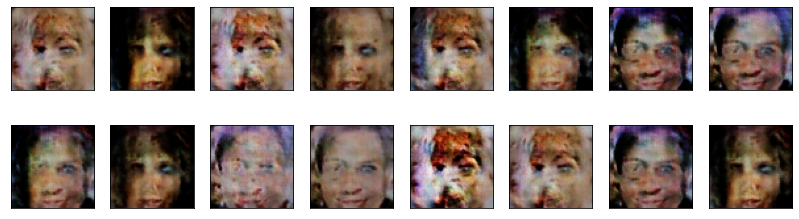

2024-07-23 04:12:54 | Epoch [39/50] | Batch 0/509 | d_loss: 0.4897 | g_loss: 6.0598
2024-07-23 04:13:01 | Epoch [39/50] | Batch 50/509 | d_loss: 0.3810 | g_loss: 3.8820
2024-07-23 04:13:08 | Epoch [39/50] | Batch 100/509 | d_loss: 0.4010 | g_loss: 4.2599
2024-07-23 04:13:14 | Epoch [39/50] | Batch 150/509 | d_loss: 0.3940 | g_loss: 5.4444
2024-07-23 04:13:21 | Epoch [39/50] | Batch 200/509 | d_loss: 0.4556 | g_loss: 5.1154
2024-07-23 04:13:28 | Epoch [39/50] | Batch 250/509 | d_loss: 0.4493 | g_loss: 3.6259
2024-07-23 04:13:36 | Epoch [39/50] | Batch 300/509 | d_loss: 0.4154 | g_loss: 3.8248
2024-07-23 04:13:42 | Epoch [39/50] | Batch 350/509 | d_loss: 0.3638 | g_loss: 4.4550
2024-07-23 04:13:49 | Epoch [39/50] | Batch 400/509 | d_loss: 0.3852 | g_loss: 4.3749
2024-07-23 04:13:56 | Epoch [39/50] | Batch 450/509 | d_loss: 0.3657 | g_loss: 5.0044
2024-07-23 04:14:03 | Epoch [39/50] | Batch 500/509 | d_loss: 0.3720 | g_loss: 4.2536


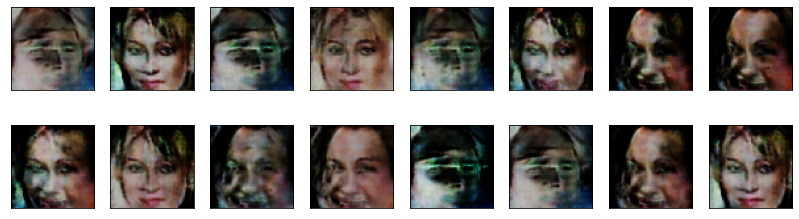

2024-07-23 04:14:09 | Epoch [40/50] | Batch 0/509 | d_loss: 0.3514 | g_loss: 4.4669
2024-07-23 04:14:16 | Epoch [40/50] | Batch 50/509 | d_loss: 0.3521 | g_loss: 4.6547
2024-07-23 04:14:23 | Epoch [40/50] | Batch 100/509 | d_loss: 0.4938 | g_loss: 4.2185
2024-07-23 04:14:31 | Epoch [40/50] | Batch 150/509 | d_loss: 0.4652 | g_loss: 4.6890
2024-07-23 04:14:38 | Epoch [40/50] | Batch 200/509 | d_loss: 0.4093 | g_loss: 5.1415
2024-07-23 04:14:44 | Epoch [40/50] | Batch 250/509 | d_loss: 0.4547 | g_loss: 3.1068
2024-07-23 04:14:51 | Epoch [40/50] | Batch 300/509 | d_loss: 0.4176 | g_loss: 3.3330
2024-07-23 04:14:58 | Epoch [40/50] | Batch 350/509 | d_loss: 0.3983 | g_loss: 3.4914
2024-07-23 04:15:05 | Epoch [40/50] | Batch 400/509 | d_loss: 0.3870 | g_loss: 3.6200
2024-07-23 04:15:12 | Epoch [40/50] | Batch 450/509 | d_loss: 0.3779 | g_loss: 4.6748
2024-07-23 04:15:19 | Epoch [40/50] | Batch 500/509 | d_loss: 0.3921 | g_loss: 4.7574


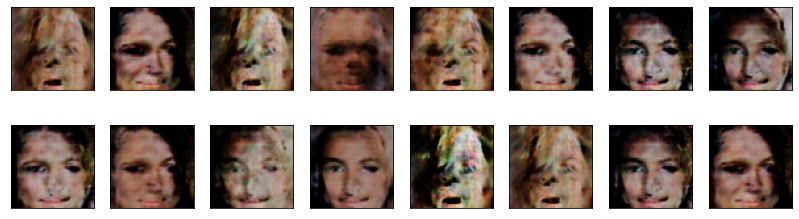

2024-07-23 04:15:25 | Epoch [41/50] | Batch 0/509 | d_loss: 0.3815 | g_loss: 4.0605
2024-07-23 04:15:32 | Epoch [41/50] | Batch 50/509 | d_loss: 0.3952 | g_loss: 4.7318
2024-07-23 04:15:39 | Epoch [41/50] | Batch 100/509 | d_loss: 0.3971 | g_loss: 3.0631
2024-07-23 04:15:46 | Epoch [41/50] | Batch 150/509 | d_loss: 0.3792 | g_loss: 4.7919
2024-07-23 04:15:53 | Epoch [41/50] | Batch 200/509 | d_loss: 0.3762 | g_loss: 5.2666
2024-07-23 04:16:00 | Epoch [41/50] | Batch 250/509 | d_loss: 0.3603 | g_loss: 3.3372
2024-07-23 04:16:07 | Epoch [41/50] | Batch 300/509 | d_loss: 0.4024 | g_loss: 4.0190
2024-07-23 04:16:13 | Epoch [41/50] | Batch 350/509 | d_loss: 0.3646 | g_loss: 5.3025
2024-07-23 04:16:20 | Epoch [41/50] | Batch 400/509 | d_loss: 0.3539 | g_loss: 4.3973
2024-07-23 04:16:27 | Epoch [41/50] | Batch 450/509 | d_loss: 0.3742 | g_loss: 4.7576
2024-07-23 04:16:34 | Epoch [41/50] | Batch 500/509 | d_loss: 0.3521 | g_loss: 4.3667


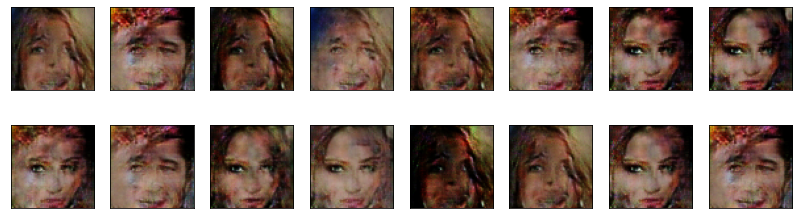

2024-07-23 04:16:39 | Epoch [42/50] | Batch 0/509 | d_loss: 0.3446 | g_loss: 5.8176
2024-07-23 04:16:46 | Epoch [42/50] | Batch 50/509 | d_loss: 0.4385 | g_loss: 3.8163
2024-07-23 04:16:53 | Epoch [42/50] | Batch 100/509 | d_loss: 0.3804 | g_loss: 4.3729
2024-07-23 04:17:00 | Epoch [42/50] | Batch 150/509 | d_loss: 0.4176 | g_loss: 3.8017
2024-07-23 04:17:07 | Epoch [42/50] | Batch 200/509 | d_loss: 0.3783 | g_loss: 3.5893
2024-07-23 04:17:14 | Epoch [42/50] | Batch 250/509 | d_loss: 0.3467 | g_loss: 5.5341
2024-07-23 04:17:21 | Epoch [42/50] | Batch 300/509 | d_loss: 0.3490 | g_loss: 6.2804
2024-07-23 04:17:28 | Epoch [42/50] | Batch 350/509 | d_loss: 0.3566 | g_loss: 5.9914
2024-07-23 04:17:35 | Epoch [42/50] | Batch 400/509 | d_loss: 0.3440 | g_loss: 4.5851
2024-07-23 04:17:42 | Epoch [42/50] | Batch 450/509 | d_loss: 0.4075 | g_loss: 3.7883
2024-07-23 04:17:50 | Epoch [42/50] | Batch 500/509 | d_loss: 0.3979 | g_loss: 6.4338


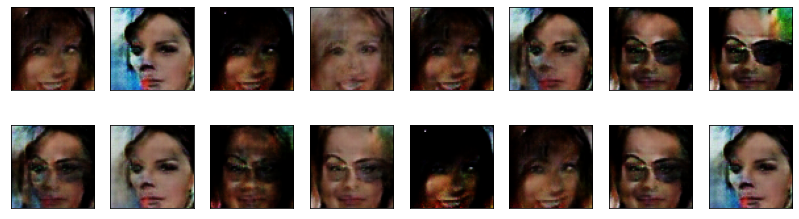

2024-07-23 04:17:55 | Epoch [43/50] | Batch 0/509 | d_loss: 0.3346 | g_loss: 6.9939
2024-07-23 04:18:02 | Epoch [43/50] | Batch 50/509 | d_loss: 0.4265 | g_loss: 3.0346
2024-07-23 04:18:09 | Epoch [43/50] | Batch 100/509 | d_loss: 0.3501 | g_loss: 6.2029
2024-07-23 04:18:16 | Epoch [43/50] | Batch 150/509 | d_loss: 0.3599 | g_loss: 6.8497
2024-07-23 04:18:23 | Epoch [43/50] | Batch 200/509 | d_loss: 0.4335 | g_loss: 5.1330
2024-07-23 04:18:30 | Epoch [43/50] | Batch 250/509 | d_loss: 0.4010 | g_loss: 4.0063
2024-07-23 04:18:37 | Epoch [43/50] | Batch 300/509 | d_loss: 0.3876 | g_loss: 3.8160
2024-07-23 04:18:44 | Epoch [43/50] | Batch 350/509 | d_loss: 0.3835 | g_loss: 4.3240
2024-07-23 04:18:51 | Epoch [43/50] | Batch 400/509 | d_loss: 0.3724 | g_loss: 3.7077
2024-07-23 04:18:58 | Epoch [43/50] | Batch 450/509 | d_loss: 0.3831 | g_loss: 3.5571
2024-07-23 04:19:05 | Epoch [43/50] | Batch 500/509 | d_loss: 0.3570 | g_loss: 5.2793


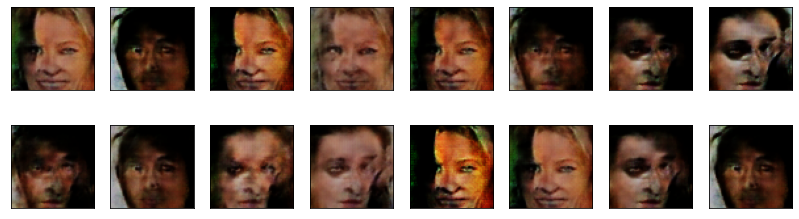

2024-07-23 04:19:09 | Epoch [44/50] | Batch 0/509 | d_loss: 0.3518 | g_loss: 6.7963
2024-07-23 04:19:16 | Epoch [44/50] | Batch 50/509 | d_loss: 0.5022 | g_loss: 5.1117
2024-07-23 04:19:23 | Epoch [44/50] | Batch 100/509 | d_loss: 0.5310 | g_loss: 8.4087
2024-07-23 04:19:30 | Epoch [44/50] | Batch 150/509 | d_loss: 0.3489 | g_loss: 6.0739
2024-07-23 04:19:37 | Epoch [44/50] | Batch 200/509 | d_loss: 0.3830 | g_loss: 3.7228
2024-07-23 04:19:44 | Epoch [44/50] | Batch 250/509 | d_loss: 0.3718 | g_loss: 5.1999
2024-07-23 04:19:51 | Epoch [44/50] | Batch 300/509 | d_loss: 0.4230 | g_loss: 5.1861
2024-07-23 04:19:58 | Epoch [44/50] | Batch 350/509 | d_loss: 0.3535 | g_loss: 6.4441
2024-07-23 04:20:05 | Epoch [44/50] | Batch 400/509 | d_loss: 0.4076 | g_loss: 4.3733
2024-07-23 04:20:12 | Epoch [44/50] | Batch 450/509 | d_loss: 0.3992 | g_loss: 3.8735
2024-07-23 04:20:18 | Epoch [44/50] | Batch 500/509 | d_loss: 0.3562 | g_loss: 5.2146


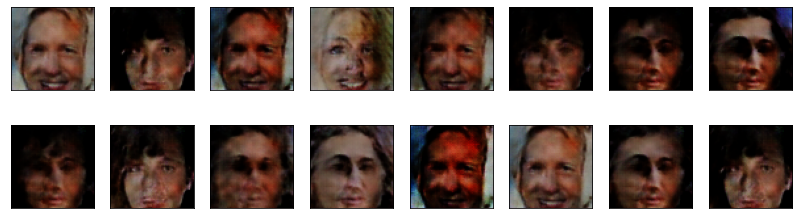

2024-07-23 04:20:24 | Epoch [45/50] | Batch 0/509 | d_loss: 0.3552 | g_loss: 6.3441
2024-07-23 04:20:31 | Epoch [45/50] | Batch 50/509 | d_loss: 0.4414 | g_loss: 7.1032
2024-07-23 04:20:38 | Epoch [45/50] | Batch 100/509 | d_loss: 0.4067 | g_loss: 5.6824
2024-07-23 04:20:45 | Epoch [45/50] | Batch 150/509 | d_loss: 0.3885 | g_loss: 3.2013
2024-07-23 04:20:52 | Epoch [45/50] | Batch 200/509 | d_loss: 0.4073 | g_loss: 5.0887
2024-07-23 04:20:59 | Epoch [45/50] | Batch 250/509 | d_loss: 0.3534 | g_loss: 4.6931
2024-07-23 04:21:06 | Epoch [45/50] | Batch 300/509 | d_loss: 0.3471 | g_loss: 6.2576
2024-07-23 04:21:13 | Epoch [45/50] | Batch 350/509 | d_loss: 0.3419 | g_loss: 4.4598
2024-07-23 04:21:19 | Epoch [45/50] | Batch 400/509 | d_loss: 0.3420 | g_loss: 5.2792
2024-07-23 04:21:26 | Epoch [45/50] | Batch 450/509 | d_loss: 0.3350 | g_loss: 5.2730
2024-07-23 04:21:33 | Epoch [45/50] | Batch 500/509 | d_loss: 0.3388 | g_loss: 5.6312


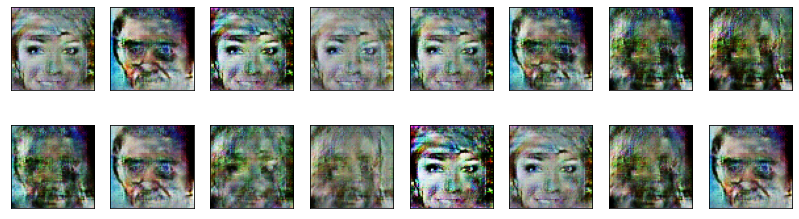

2024-07-23 04:21:39 | Epoch [46/50] | Batch 0/509 | d_loss: 0.3378 | g_loss: 5.8145
2024-07-23 04:21:46 | Epoch [46/50] | Batch 50/509 | d_loss: 0.3370 | g_loss: 6.1176
2024-07-23 04:21:53 | Epoch [46/50] | Batch 100/509 | d_loss: 0.3328 | g_loss: 7.0300
2024-07-23 04:22:00 | Epoch [46/50] | Batch 150/509 | d_loss: 0.3331 | g_loss: 6.0232
2024-07-23 04:22:07 | Epoch [46/50] | Batch 200/509 | d_loss: 0.3357 | g_loss: 5.9306
2024-07-23 04:22:14 | Epoch [46/50] | Batch 250/509 | d_loss: 0.3514 | g_loss: 5.5771
2024-07-23 04:22:21 | Epoch [46/50] | Batch 300/509 | d_loss: 0.3492 | g_loss: 5.3657
2024-07-23 04:22:28 | Epoch [46/50] | Batch 350/509 | d_loss: 0.3481 | g_loss: 6.3209
2024-07-23 04:22:35 | Epoch [46/50] | Batch 400/509 | d_loss: 0.3316 | g_loss: 6.5318
2024-07-23 04:22:42 | Epoch [46/50] | Batch 450/509 | d_loss: 1.4121 | g_loss: 1.8391
2024-07-23 04:22:48 | Epoch [46/50] | Batch 500/509 | d_loss: 0.4600 | g_loss: 4.3065


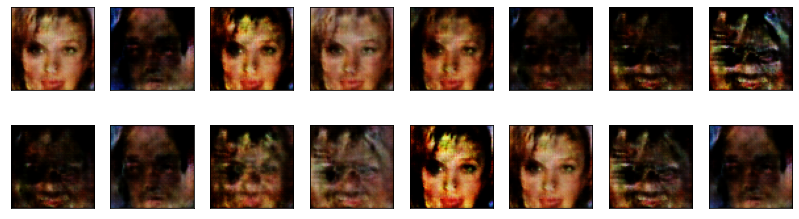

2024-07-23 04:22:54 | Epoch [47/50] | Batch 0/509 | d_loss: 0.3764 | g_loss: 4.6854
2024-07-23 04:23:01 | Epoch [47/50] | Batch 50/509 | d_loss: 0.5173 | g_loss: 5.6003
2024-07-23 04:23:08 | Epoch [47/50] | Batch 100/509 | d_loss: 0.4377 | g_loss: 3.6547
2024-07-23 04:23:15 | Epoch [47/50] | Batch 150/509 | d_loss: 0.4376 | g_loss: 2.8541
2024-07-23 04:23:22 | Epoch [47/50] | Batch 200/509 | d_loss: 0.3765 | g_loss: 4.1817
2024-07-23 04:23:29 | Epoch [47/50] | Batch 250/509 | d_loss: 0.4019 | g_loss: 4.4399
2024-07-23 04:23:36 | Epoch [47/50] | Batch 300/509 | d_loss: 0.3757 | g_loss: 4.5333
2024-07-23 04:23:43 | Epoch [47/50] | Batch 350/509 | d_loss: 0.3626 | g_loss: 4.5824
2024-07-23 04:23:50 | Epoch [47/50] | Batch 400/509 | d_loss: 0.3620 | g_loss: 4.7401
2024-07-23 04:23:57 | Epoch [47/50] | Batch 450/509 | d_loss: 0.4352 | g_loss: 2.8648
2024-07-23 04:24:04 | Epoch [47/50] | Batch 500/509 | d_loss: 0.3987 | g_loss: 3.7351


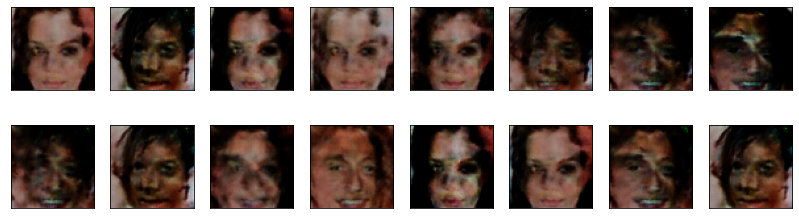

2024-07-23 04:24:10 | Epoch [48/50] | Batch 0/509 | d_loss: 0.4929 | g_loss: 3.3979
2024-07-23 04:24:17 | Epoch [48/50] | Batch 50/509 | d_loss: 0.4046 | g_loss: 4.5310
2024-07-23 04:24:24 | Epoch [48/50] | Batch 100/509 | d_loss: 0.4095 | g_loss: 5.1564
2024-07-23 04:24:31 | Epoch [48/50] | Batch 150/509 | d_loss: 0.3550 | g_loss: 5.7896
2024-07-23 04:24:38 | Epoch [48/50] | Batch 200/509 | d_loss: 0.4087 | g_loss: 3.7961
2024-07-23 04:24:45 | Epoch [48/50] | Batch 250/509 | d_loss: 0.3964 | g_loss: 4.0671
2024-07-23 04:24:52 | Epoch [48/50] | Batch 300/509 | d_loss: 0.4386 | g_loss: 3.3431
2024-07-23 04:24:59 | Epoch [48/50] | Batch 350/509 | d_loss: 0.4084 | g_loss: 3.8618
2024-07-23 04:25:05 | Epoch [48/50] | Batch 400/509 | d_loss: 0.3758 | g_loss: 5.4753
2024-07-23 04:25:12 | Epoch [48/50] | Batch 450/509 | d_loss: 0.3755 | g_loss: 5.0896
2024-07-23 04:25:19 | Epoch [48/50] | Batch 500/509 | d_loss: 0.3590 | g_loss: 5.5013


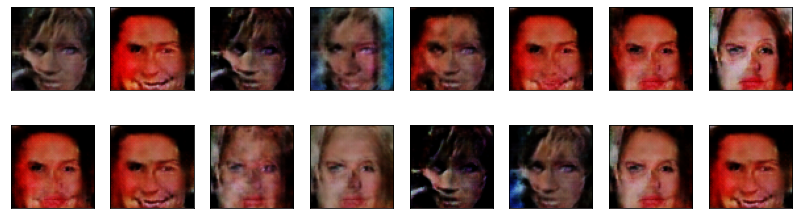

2024-07-23 04:25:25 | Epoch [49/50] | Batch 0/509 | d_loss: 0.3980 | g_loss: 2.9925
2024-07-23 04:25:32 | Epoch [49/50] | Batch 50/509 | d_loss: 0.3907 | g_loss: 4.3434
2024-07-23 04:25:39 | Epoch [49/50] | Batch 100/509 | d_loss: 0.4556 | g_loss: 4.4946
2024-07-23 04:25:46 | Epoch [49/50] | Batch 150/509 | d_loss: 0.3964 | g_loss: 4.7671
2024-07-23 04:25:53 | Epoch [49/50] | Batch 200/509 | d_loss: 0.4232 | g_loss: 3.5106
2024-07-23 04:26:00 | Epoch [49/50] | Batch 250/509 | d_loss: 1.1035 | g_loss: 11.6765
2024-07-23 04:26:07 | Epoch [49/50] | Batch 300/509 | d_loss: 0.3655 | g_loss: 4.7991
2024-07-23 04:26:14 | Epoch [49/50] | Batch 350/509 | d_loss: 0.3936 | g_loss: 4.1975
2024-07-23 04:26:21 | Epoch [49/50] | Batch 400/509 | d_loss: 0.3822 | g_loss: 5.2936
2024-07-23 04:26:28 | Epoch [49/50] | Batch 450/509 | d_loss: 0.3753 | g_loss: 4.9488
2024-07-23 04:26:34 | Epoch [49/50] | Batch 500/509 | d_loss: 0.3516 | g_loss: 4.1651


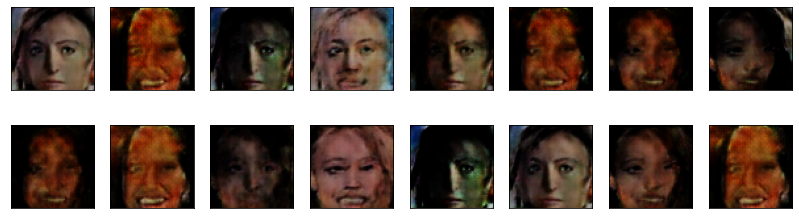

2024-07-23 04:26:39 | Epoch [50/50] | Batch 0/509 | d_loss: 0.3560 | g_loss: 5.5570
2024-07-23 04:26:46 | Epoch [50/50] | Batch 50/509 | d_loss: 0.3543 | g_loss: 5.5953
2024-07-23 04:26:53 | Epoch [50/50] | Batch 100/509 | d_loss: 0.3764 | g_loss: 5.6666
2024-07-23 04:27:00 | Epoch [50/50] | Batch 150/509 | d_loss: 0.3463 | g_loss: 5.6854
2024-07-23 04:27:07 | Epoch [50/50] | Batch 200/509 | d_loss: 0.3416 | g_loss: 4.9786
2024-07-23 04:27:14 | Epoch [50/50] | Batch 250/509 | d_loss: 0.3728 | g_loss: 4.7398
2024-07-23 04:27:21 | Epoch [50/50] | Batch 300/509 | d_loss: 0.3420 | g_loss: 5.6523
2024-07-23 04:27:28 | Epoch [50/50] | Batch 350/509 | d_loss: 0.3838 | g_loss: 3.7789
2024-07-23 04:27:35 | Epoch [50/50] | Batch 400/509 | d_loss: 0.8173 | g_loss: 13.2431
2024-07-23 04:27:42 | Epoch [50/50] | Batch 450/509 | d_loss: 0.3934 | g_loss: 4.6005
2024-07-23 04:27:49 | Epoch [50/50] | Batch 500/509 | d_loss: 0.4009 | g_loss: 5.3739


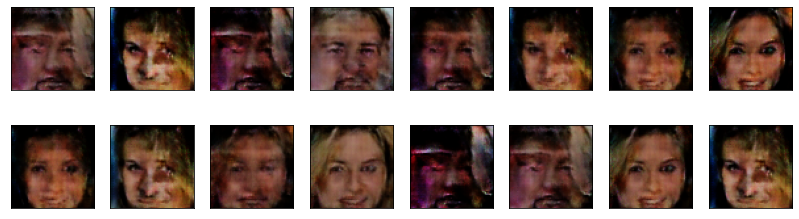

In [32]:
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().cuda()

losses = []
for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)
        real_images = scale(real_images)
        ####################################
        
        # TODO: implement the training strategy
               
        d_loss = discriminator_step(batch_size, latent_dim, real_images)
        
        g_loss = generator_step(batch_size, latent_dim)
        
        ####################################
        
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss['loss'].item()
            g = g_loss['loss'].item()
            losses.append((d, g))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')
            save_model(discriminator, generator, d_optimizer, g_optimizer)
    
    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)
    generator.train()

with open('generated_images.pkl', 'wb') as f:
    pkl.dump(generated_images, f)

### Training losses

Plot the training losses for the generator and discriminator.

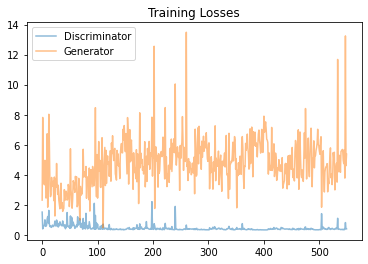

In [33]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:** it's an okay samples maybe bigger model will be much better


### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.